# Stock Market Model Analysis

This notebook analyses the outputs produced by the current `main.py`.

**Models:** GBM, Historical Bootstrap, Jump Diffusion, GARCH  
**Stocks:** AAPL, TSLA, NVDA, KO, SPY  
**Evaluation years:** 2016, 2020, 2025  
**Strategies:** Probability, Expected Return, Probability + VaR

The notebook uses the generated CSV files rather than re-running the simulations.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pd.set_option("display.max_columns", None)
pd.set_option("display.width", 140)

stocks = ["AAPL", "TSLA", "NVDA", "KO", "SPY"]
years = [2016, 2020, 2025]

models = [
    "GBM",
    "Historical Bootstrap",
    "Jump Diffusion",
    "GARCH"
]

strategies = [
    "Probability",
    "Expected Return",
    "Probability + VaR"
]


In [2]:
# Load results produced by main.py

yearly_results = pd.read_csv("yearly_results.csv")
strategy_results = pd.read_csv("strategy_results.csv")
comparison = pd.read_csv("comparison.csv")

final_prices = pd.read_csv("final_prices.csv")
sample_paths = pd.read_csv("sample_paths.csv")

# Analyse only the selected evaluation years
yearly_results = yearly_results[yearly_results["Year"].isin(years)].copy()
strategy_results = strategy_results[strategy_results["Year"].isin(years)].copy()

print("yearly_results:")
print(yearly_results.head())

print("\nstrategy_results:")
print(strategy_results.head())

print("\ncomparison:")
print(comparison.head())


yearly_results:
   Ticker  Model  Year          S0  Probability Up   Predicted      Actual  Actual Return (%)    APE (%)    VaR (%)     ES (%)  \
0    AAPL  GARCH  2016   24.403900          0.8698   38.243087   23.668432          -3.013731  61.578455 -15.891598 -28.158431   
4    AAPL  GARCH  2020   37.394245          0.8619   51.975750   70.659340          88.957792  26.441783 -13.421197 -22.738151   
9    AAPL  GARCH  2025  190.211029          0.8425  262.046487  248.615784          30.705241   5.402193 -16.969162 -25.973632   
10   AAPL    GBM  2016   24.403900          0.8221   36.035813   23.668432          -3.013731  52.252641 -21.915127 -32.012679   
14   AAPL    GBM  2020   37.394245          0.8417   50.205419   70.659340          88.957792  28.947229 -15.519537 -23.769882   

      Lower CI    Upper CI  
0    20.525731   64.024769  
4    32.375490   78.131553  
9   157.933811  403.300020  
10   19.055754   59.971181  
14   31.590832   74.826054  

strategy_results:
   Ticker 

## 1. Prediction error

For each stock/model/year:

$$APE = \\left|\\frac{Actual - Predicted}{Actual}\\right| \\times 100$$

APE is calculated separately for every year. We then use:

- **MAPE** = mean APE
- **Median APE** = median APE

Median APE is useful because a few unusually difficult years can pull the mean upwards substantially.


In [3]:
# Calculate yearly APE

yearly_results["APE (%)"] = (
    abs(
        (yearly_results["Actual"] - yearly_results["Predicted"])
        / yearly_results["Actual"]
    ) * 100
)

yearly_ape = (
    yearly_results[
        ["Ticker", "Model", "Year", "APE (%)"]
    ]
    .sort_values(["Ticker", "Model", "Year"])
)

print(yearly_ape.to_string(index=False))


Ticker                Model  Year    APE (%)
  AAPL                GARCH  2016  61.578455
  AAPL                GARCH  2020  26.441783
  AAPL                GARCH  2025   5.402193
  AAPL                  GBM  2016  52.252641
  AAPL                  GBM  2020  28.947229
  AAPL                  GBM  2025   1.290188
  AAPL Historical Bootstrap  2016  52.516045
  AAPL Historical Bootstrap  2020  28.487397
  AAPL Historical Bootstrap  2025   1.669570
  AAPL       Jump Diffusion  2016  59.016996
  AAPL       Jump Diffusion  2020  22.649525
  AAPL       Jump Diffusion  2025   4.832608
    KO                GARCH  2016   8.378031
    KO                GARCH  2020   5.866392
    KO                GARCH  2025   1.802749
    KO                  GBM  2016   7.032659
    KO                  GBM  2020   6.738829
    KO                  GBM  2025   0.122036
    KO Historical Bootstrap  2016   6.873445
    KO Historical Bootstrap  2020   6.808447
    KO Historical Bootstrap  2025   0.051134
    KO    

In [4]:
# MAPE and Median APE by ticker/model

mape_results = (
    yearly_results
    .groupby(["Ticker", "Model"])["APE (%)"]
    .mean()
    .reset_index()
    .rename(columns={"APE (%)": "MAPE (%)"})
)

median_ape = (
    yearly_results
    .groupby(["Ticker", "Model"])["APE (%)"]
    .median()
    .reset_index()
    .rename(columns={"APE (%)": "Median APE (%)"})
)

print("MAPE:")
print(mape_results)

print("\nMedian APE:")
print(median_ape)


MAPE:
   Ticker                 Model   MAPE (%)
0    AAPL                 GARCH  31.140810
1    AAPL                   GBM  27.496686
2    AAPL  Historical Bootstrap  27.557670
3    AAPL        Jump Diffusion  28.833043
4      KO                 GARCH   5.349057
5      KO                   GBM   4.631175
6      KO  Historical Bootstrap   4.577675
7      KO        Jump Diffusion   6.337801
8    NVDA                 GARCH  16.204134
9    NVDA                   GBM  25.492021
10   NVDA  Historical Bootstrap  25.598475
11   NVDA        Jump Diffusion  19.259115
12    SPY                 GARCH  10.004131
13    SPY                   GBM  10.072926
14    SPY  Historical Bootstrap   9.996902
15    SPY        Jump Diffusion   9.821026
16   TSLA                 GARCH  56.083035
17   TSLA                   GBM  35.045603
18   TSLA  Historical Bootstrap  33.980807
19   TSLA        Jump Diffusion  65.283040

Median APE:
   Ticker                 Model  Median APE (%)
0    AAPL                 GARC

## 2. APE model comparison by year

One bar chart per stock and selected evaluation year. Lower is better.


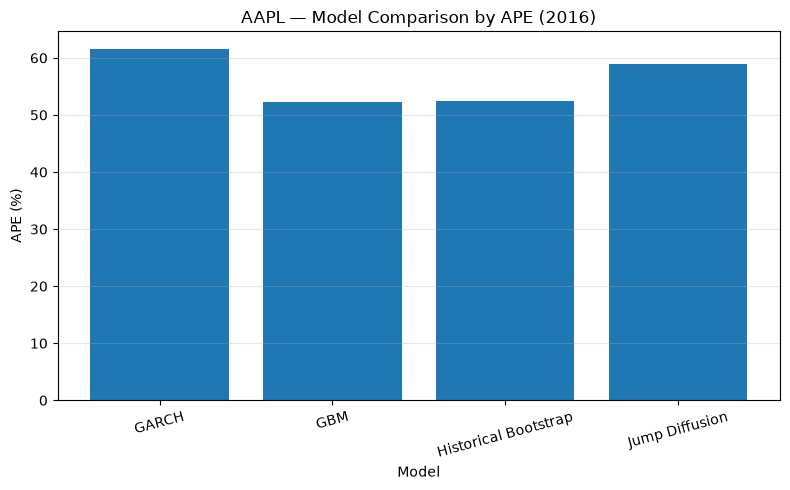

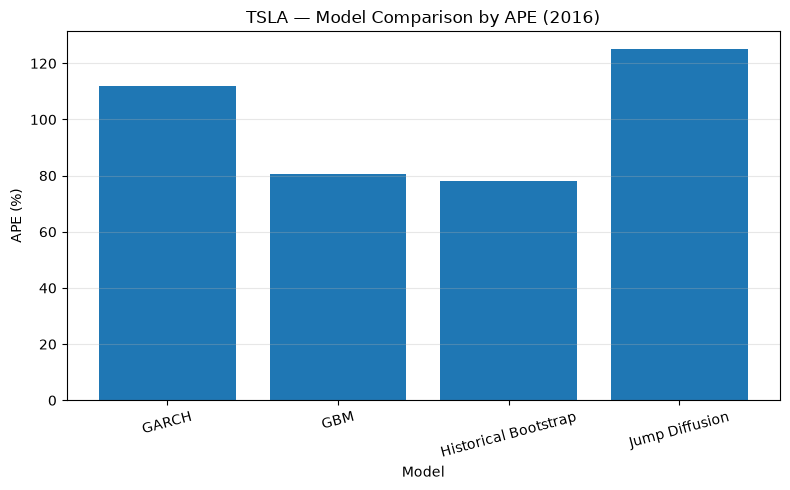

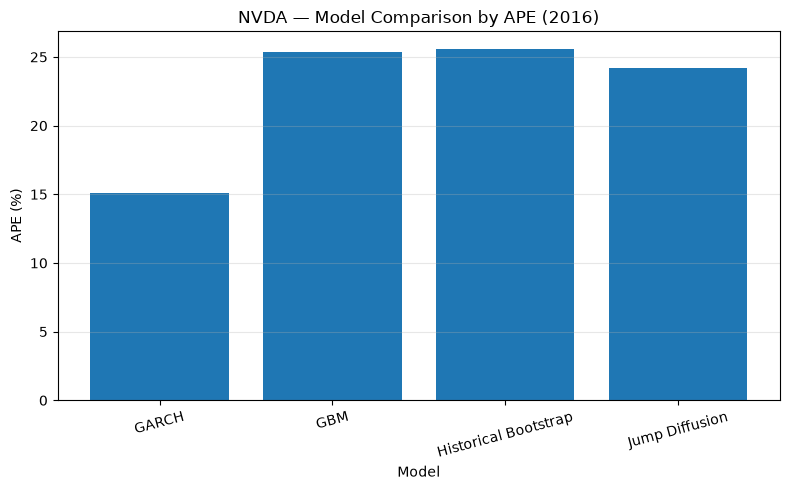

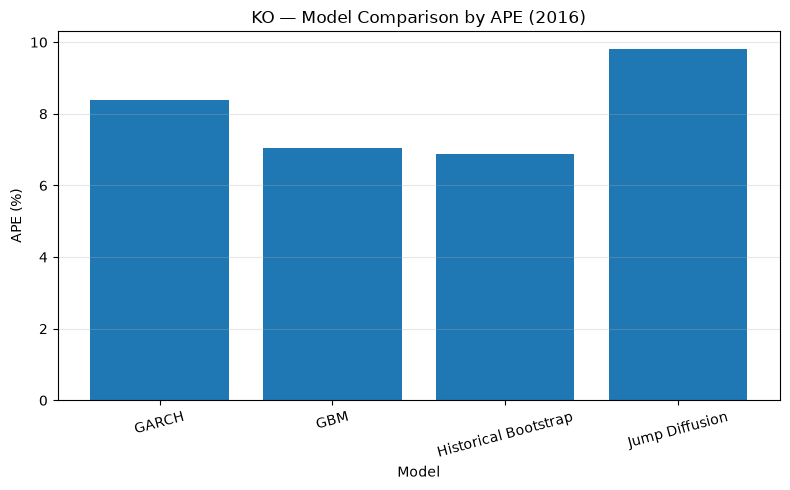

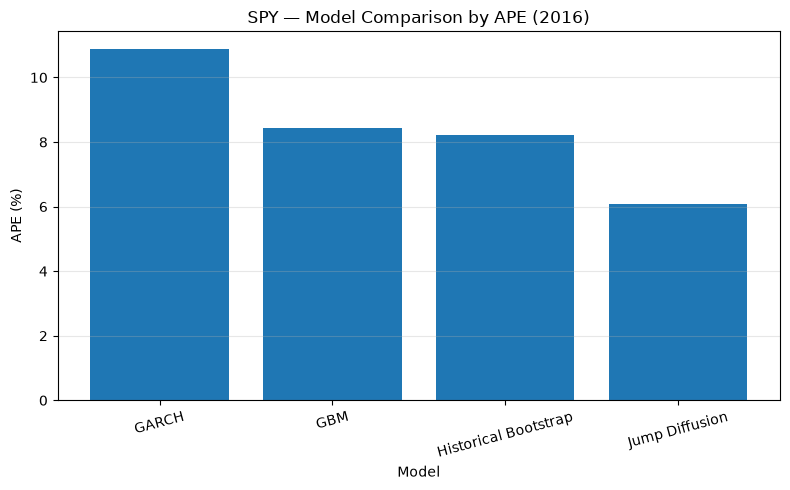

...

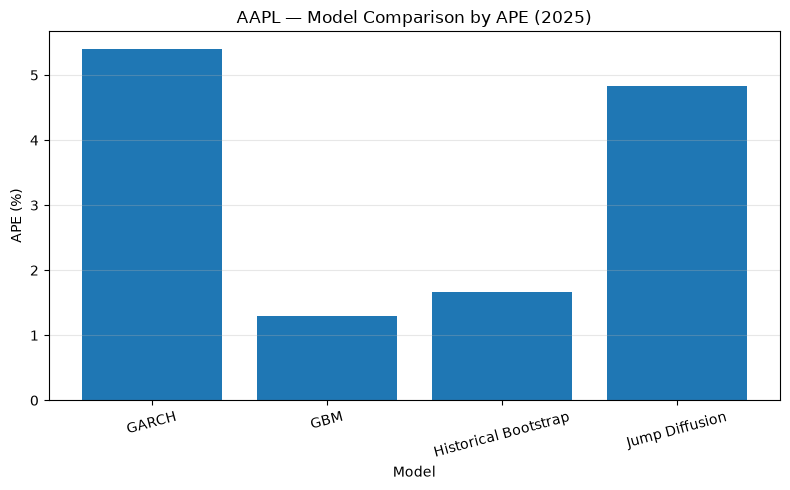

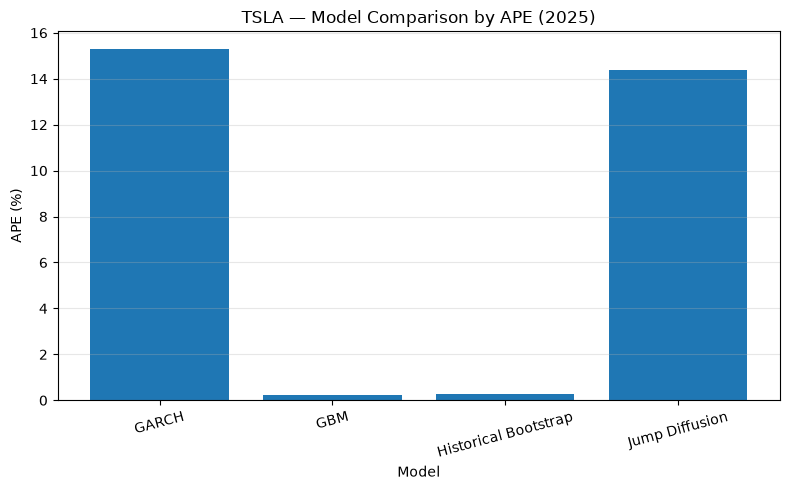

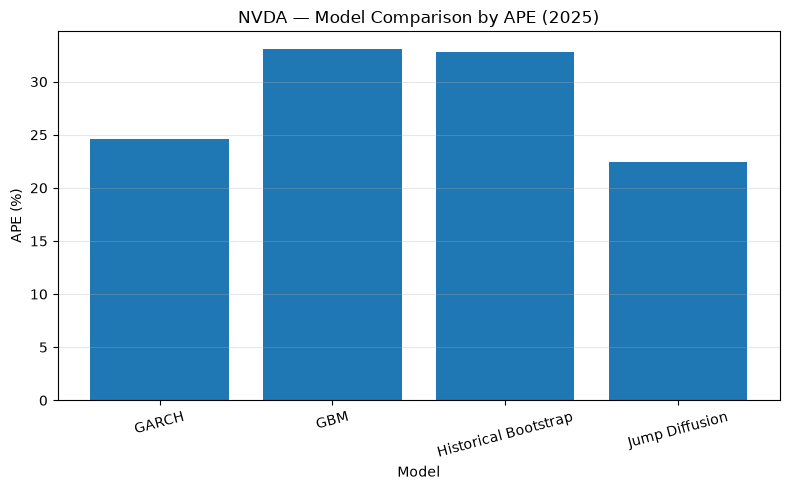

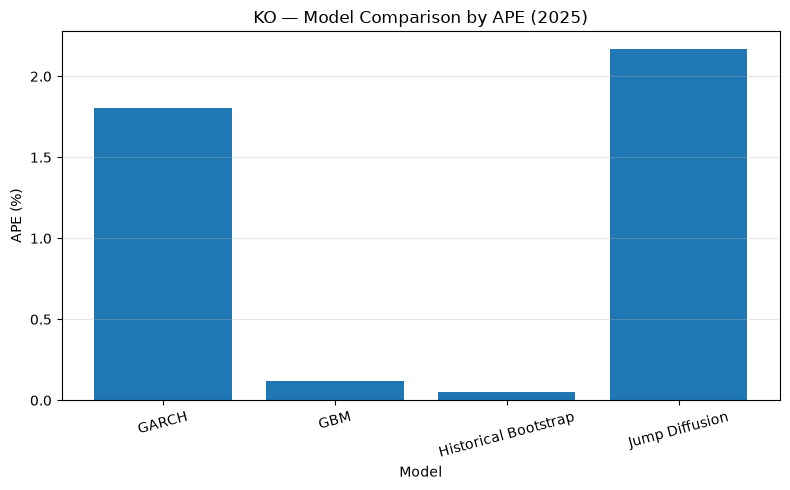

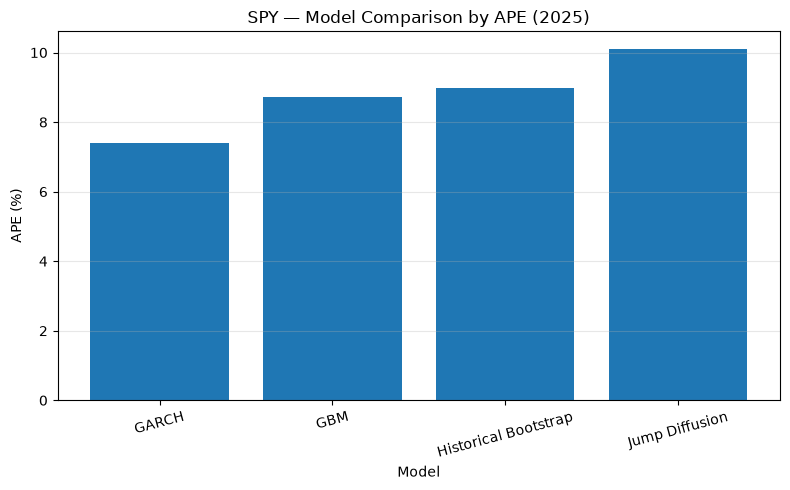

In [5]:
# MAPE by selected evaluation year

for year in years:
    current_year = yearly_results[yearly_results["Year"] == year]

    mape_year = (
        current_year
        .groupby(["Ticker", "Model"])["APE (%)"]
        .mean()
        .reset_index()
    )

    for ticker in stocks:
        current = mape_year[mape_year["Ticker"] == ticker]

        plt.figure(figsize=(8, 5))
        plt.bar(current["Model"], current["APE (%)"])
        plt.xlabel("Model")
        plt.ylabel("APE (%)")
        plt.title(f"{ticker} — Model Comparison by APE ({year})")
        plt.xticks(rotation=15)
        plt.grid(axis="y", alpha=0.3)
        plt.tight_layout()
        plt.show()


## 3. Median APE model comparison by year

One bar chart per stock and selected evaluation year.


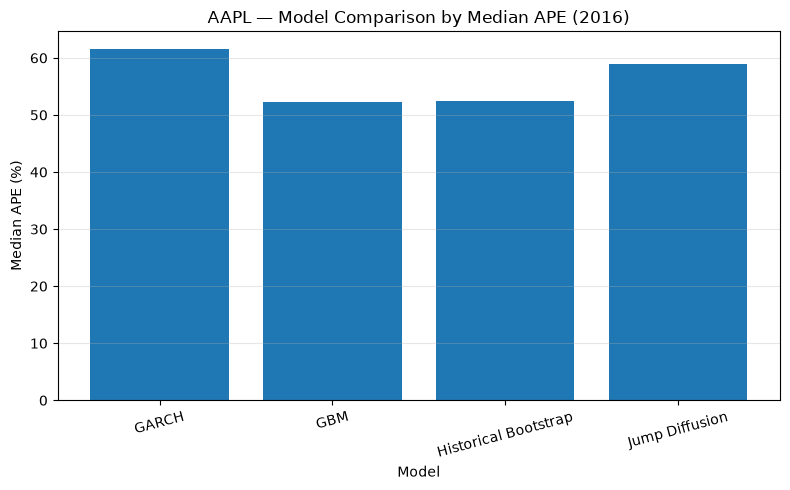

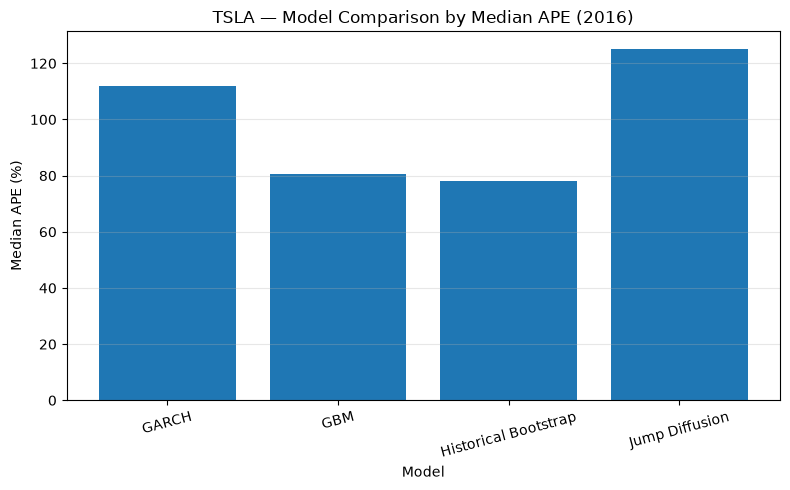

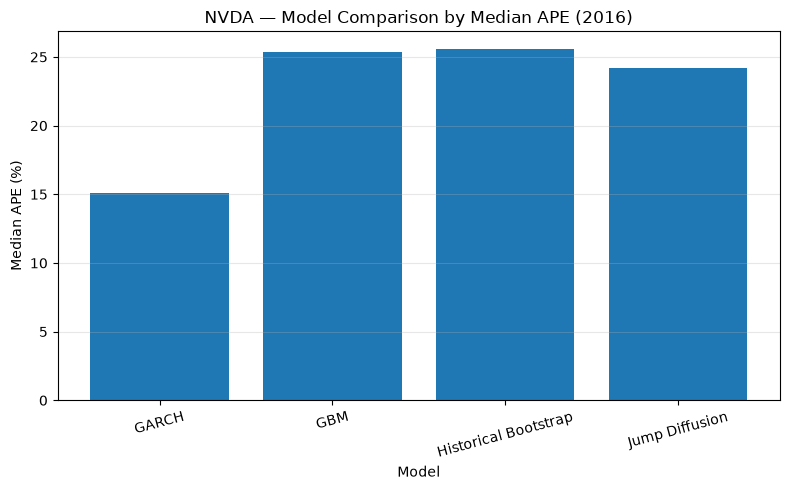

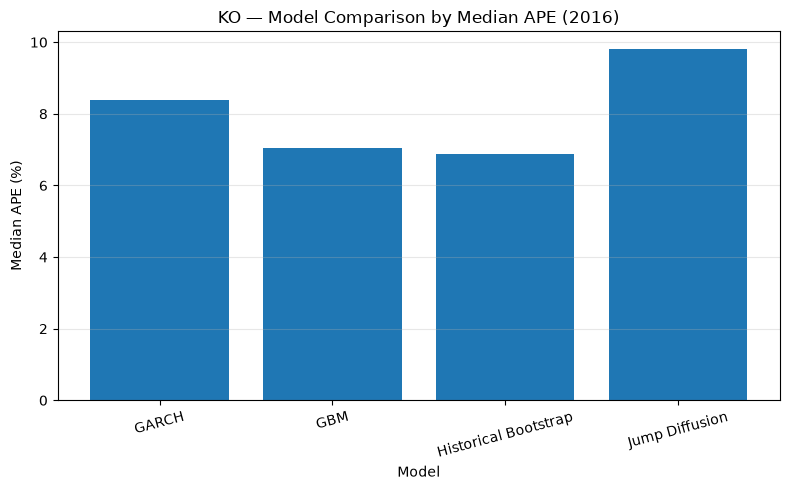

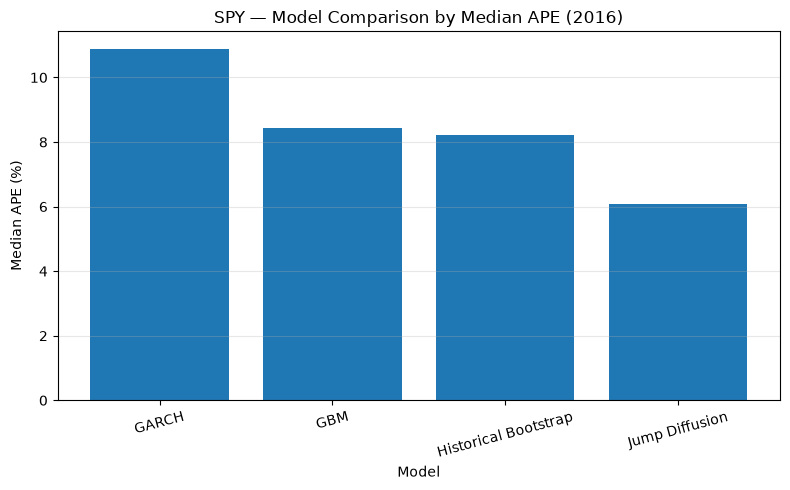

...

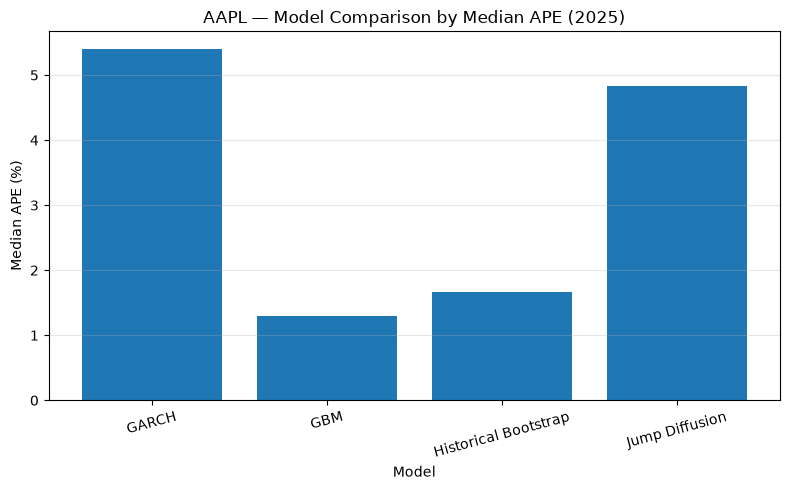

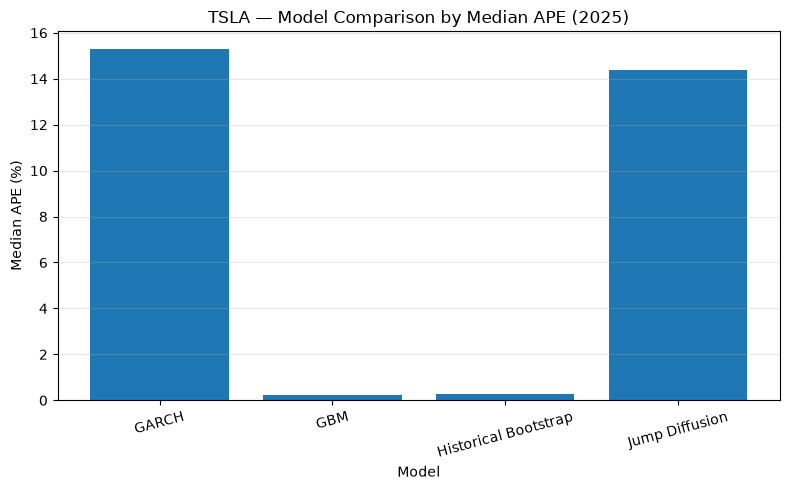

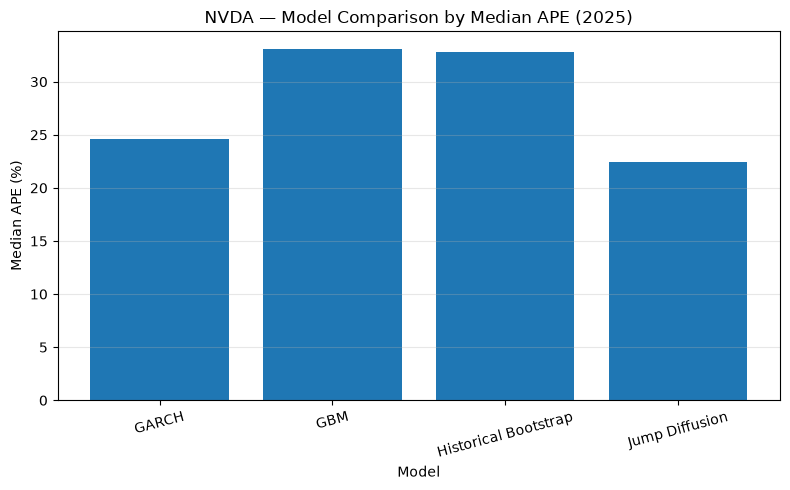

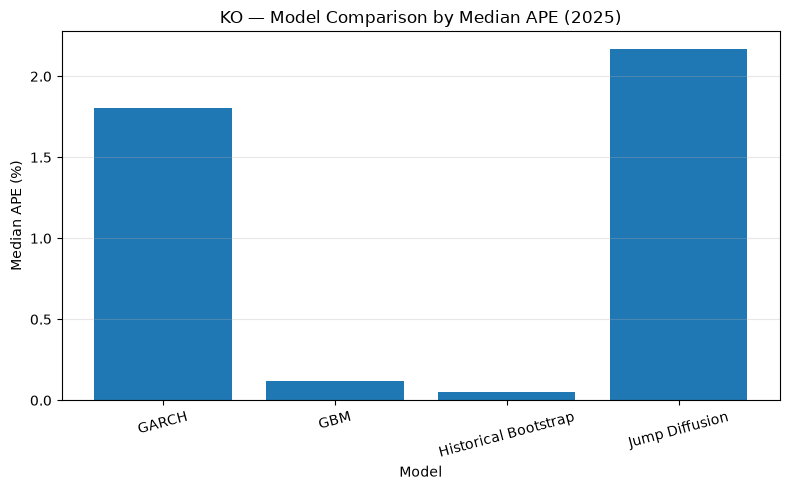

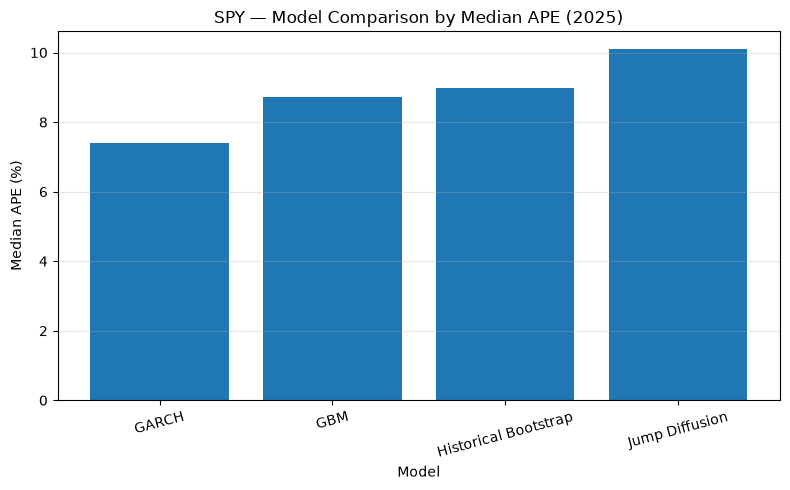

In [6]:
# Median APE by selected evaluation year

for year in years:
    current_year = yearly_results[yearly_results["Year"] == year]

    median_year = (
        current_year
        .groupby(["Ticker", "Model"])["APE (%)"]
        .median()
        .reset_index()
    )

    for ticker in stocks:
        current = median_year[median_year["Ticker"] == ticker]

        plt.figure(figsize=(8, 5))
        plt.bar(current["Model"], current["APE (%)"])
        plt.xlabel("Model")
        plt.ylabel("Median APE (%)")
        plt.title(f"{ticker} — Model Comparison by Median APE ({year})")
        plt.xticks(rotation=15)
        plt.grid(axis="y", alpha=0.3)
        plt.tight_layout()
        plt.show()


## 4. Prediction error by selected year

One graph per stock and selected evaluation year. Each bar is the APE for a model.


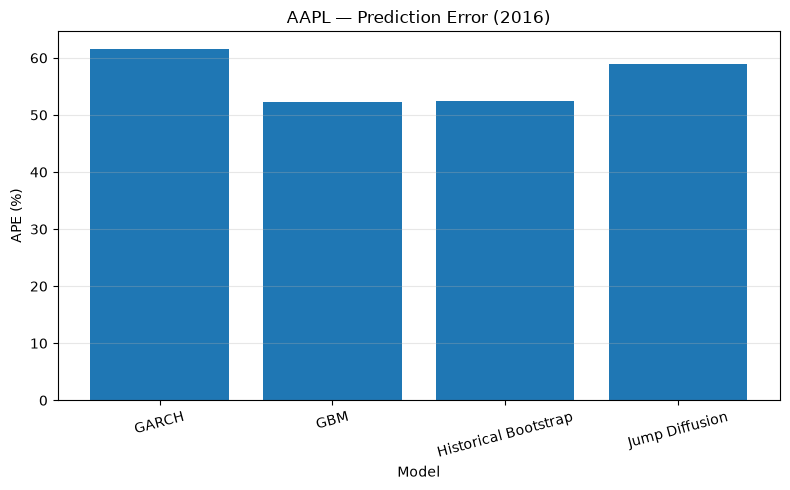

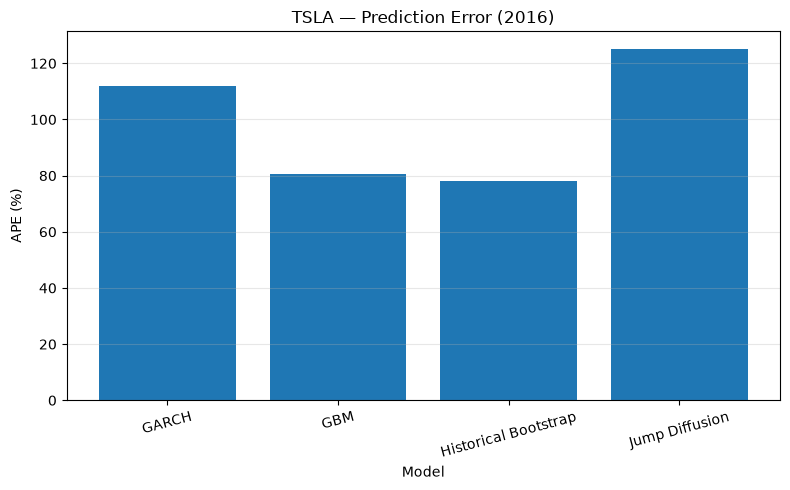

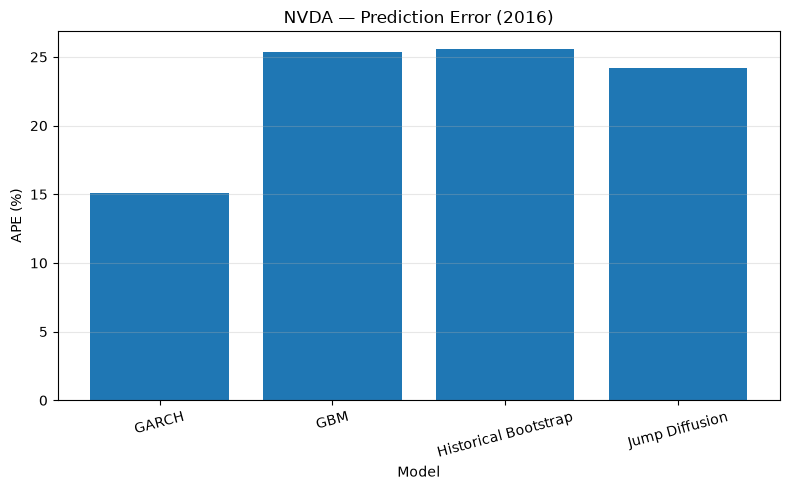

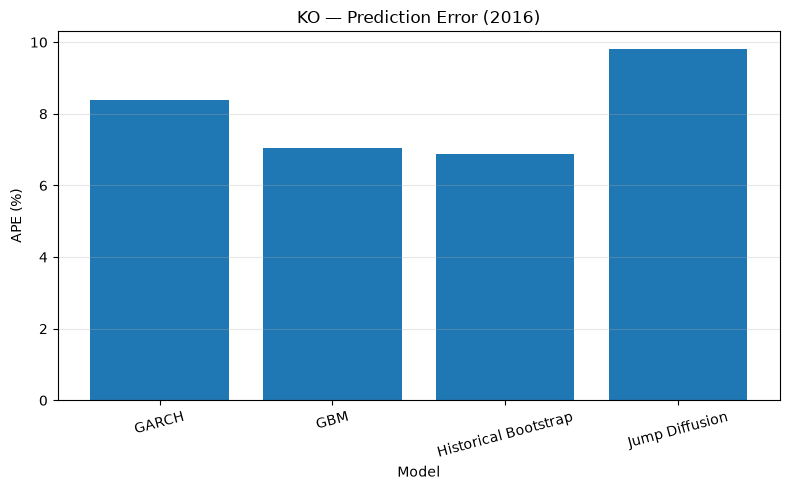

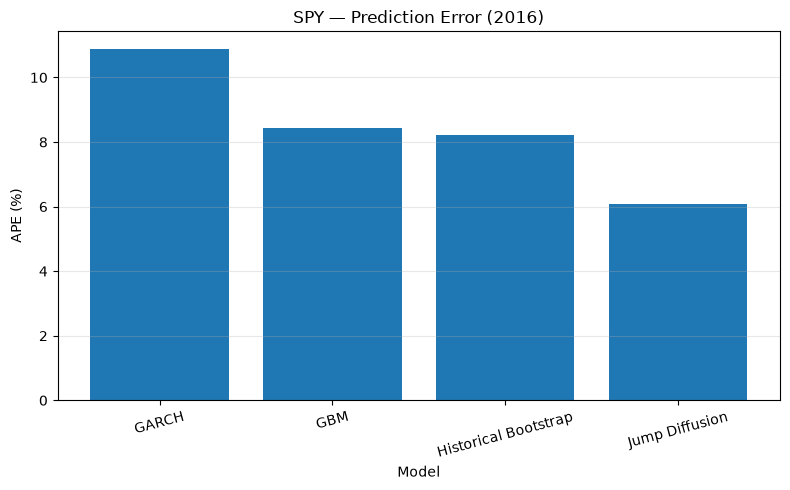

...

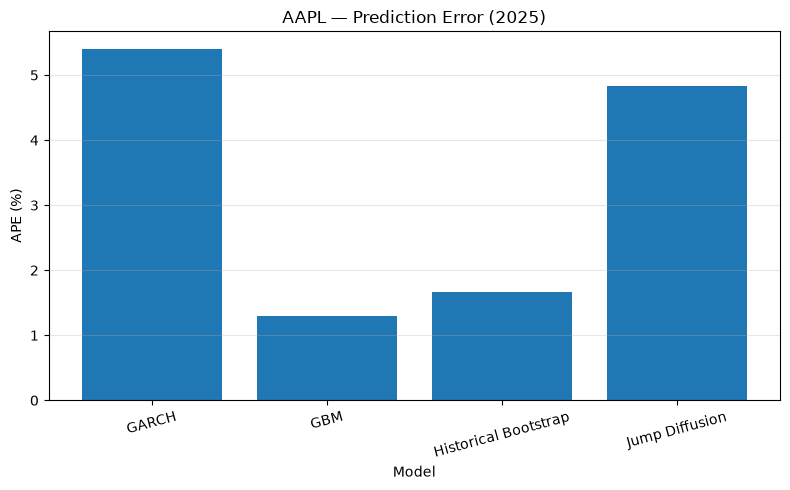

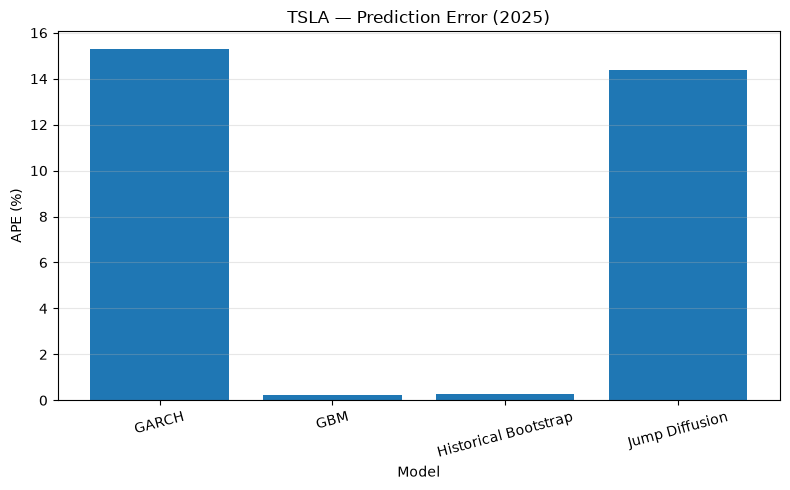

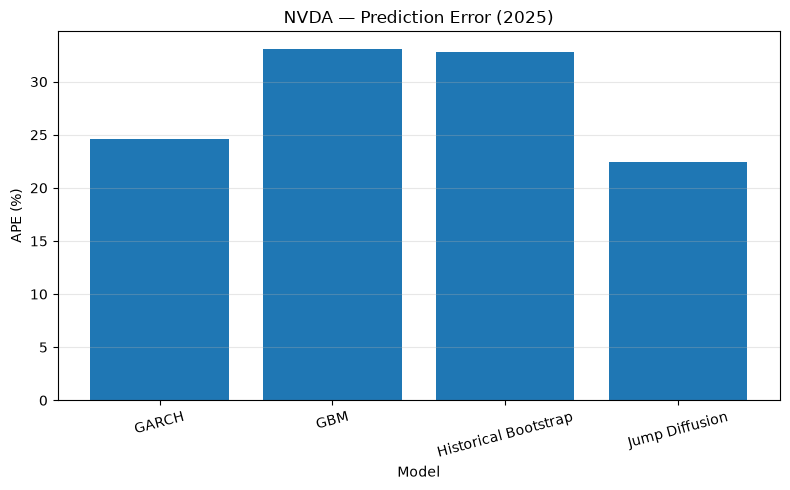

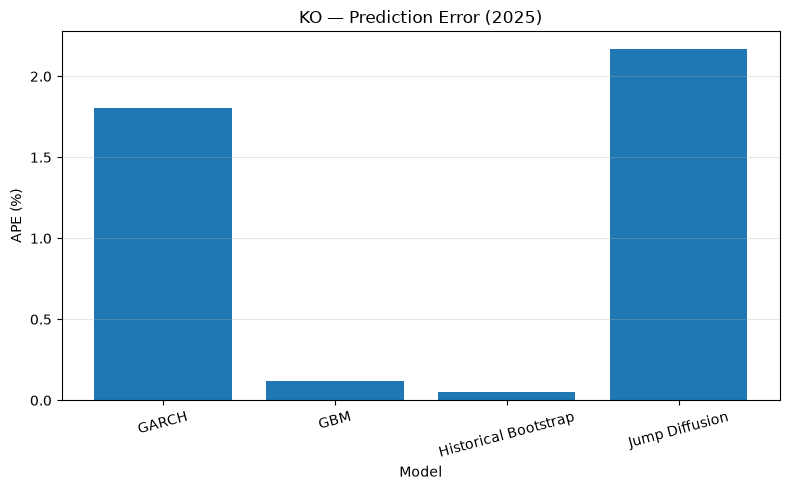

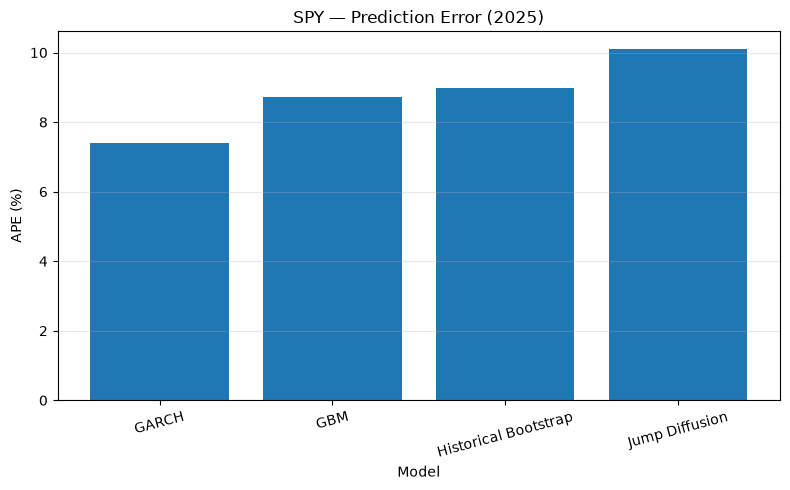

In [7]:
for year in years:
    for ticker in stocks:

        current = yearly_ape[
            (yearly_ape["Ticker"] == ticker) &
            (yearly_ape["Year"] == year)
        ]

        plt.figure(figsize=(8, 5))

        plt.bar(
            current["Model"],
            current["APE (%)"]
        )

        plt.xlabel("Model")
        plt.ylabel("APE (%)")
        plt.title(f"{ticker} — Prediction Error ({year})")
        plt.xticks(rotation=15)
        plt.grid(axis="y", alpha=0.3)
        plt.tight_layout()
        plt.show()


## 5. Historical price progression

This shows the actual end-of-year closing price for the selected evaluation years: 2016, 2020 and 2025.


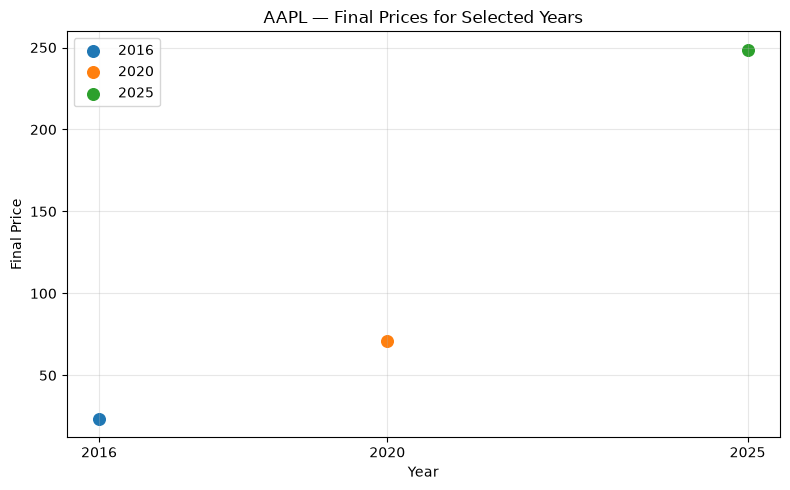

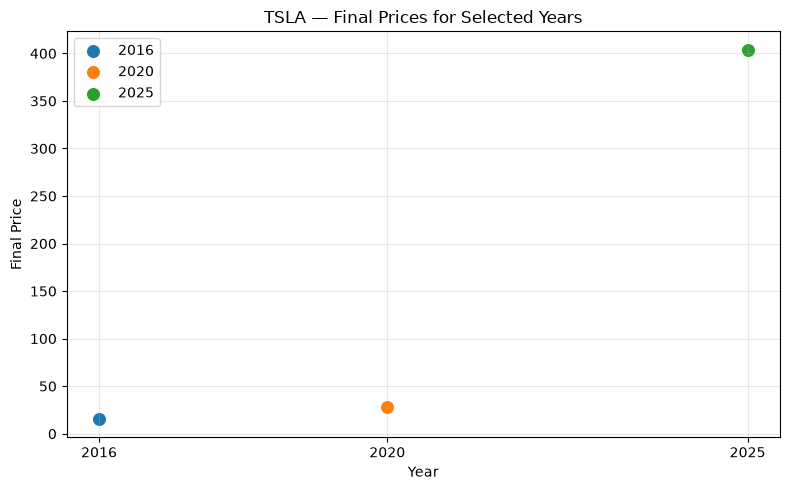

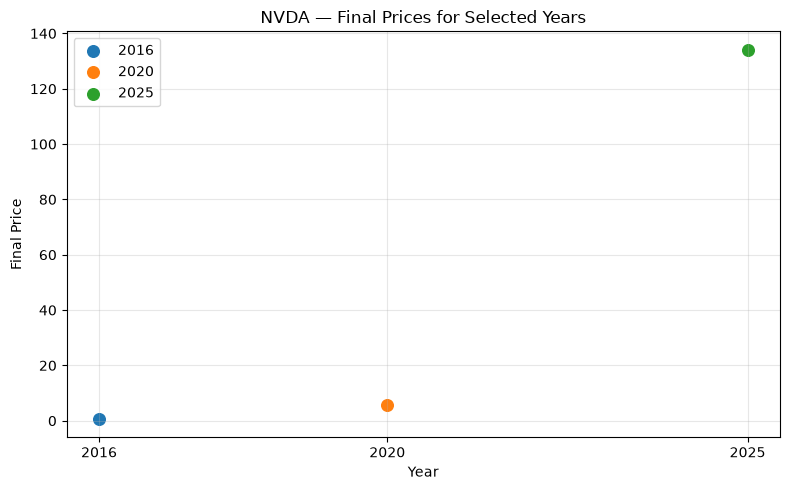

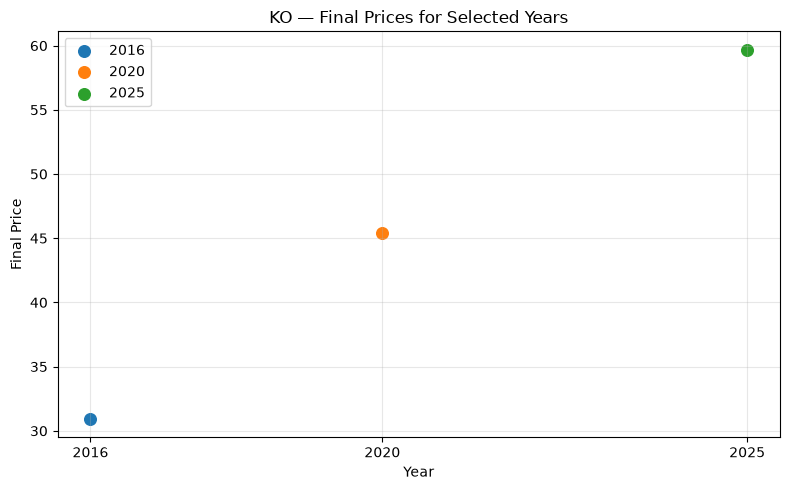

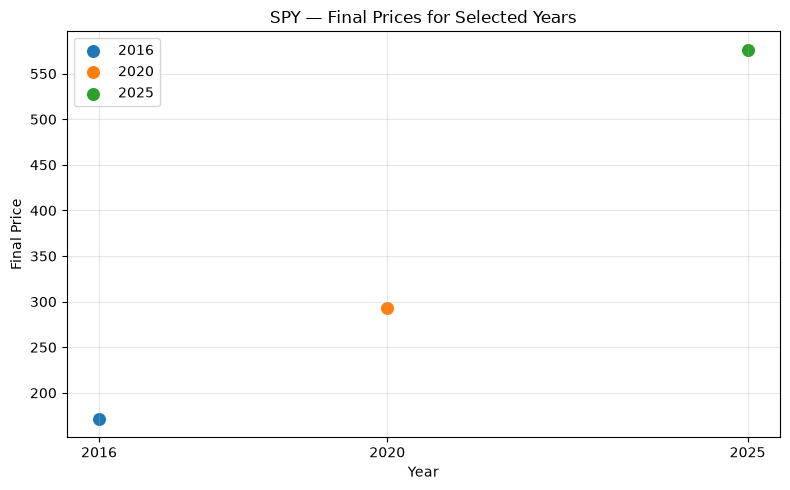

In [8]:
for ticker in stocks:

    current = (
        yearly_results[yearly_results["Ticker"] == ticker]
        .sort_values("Year")
        .drop_duplicates("Year")
    )

    plt.figure(figsize=(8, 5))

    for year in years:
        data = current[current["Year"] == year]
        plt.scatter(data["Year"], data["Actual"], s=70, label=str(year))

    plt.xlabel("Year")
    plt.ylabel("Final Price")
    plt.title(f"{ticker} — Final Prices for Selected Years")
    plt.xticks(years)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


## 6. Directional accuracy by year

Directional accuracy is evaluated separately for each selected year.


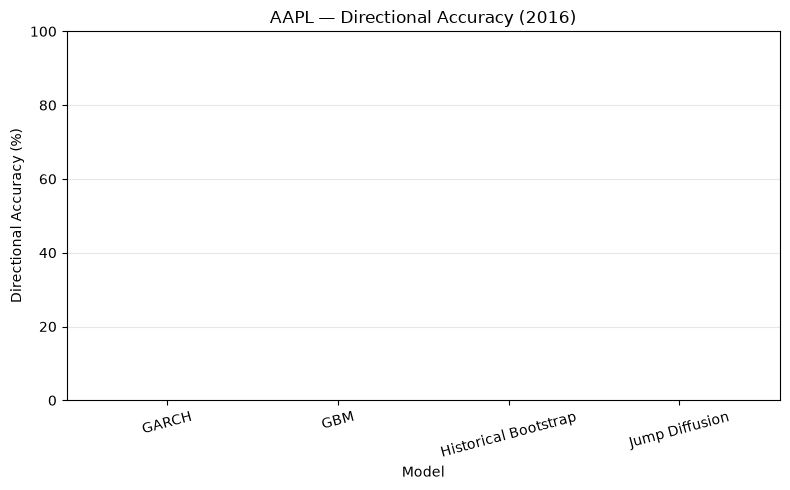

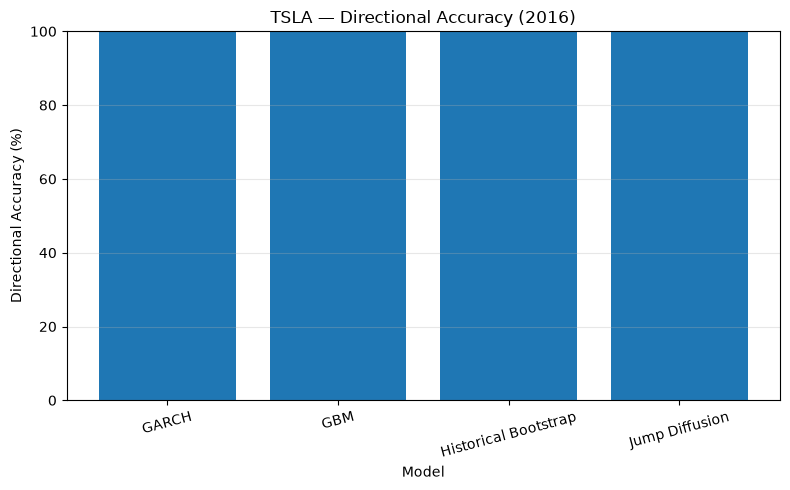

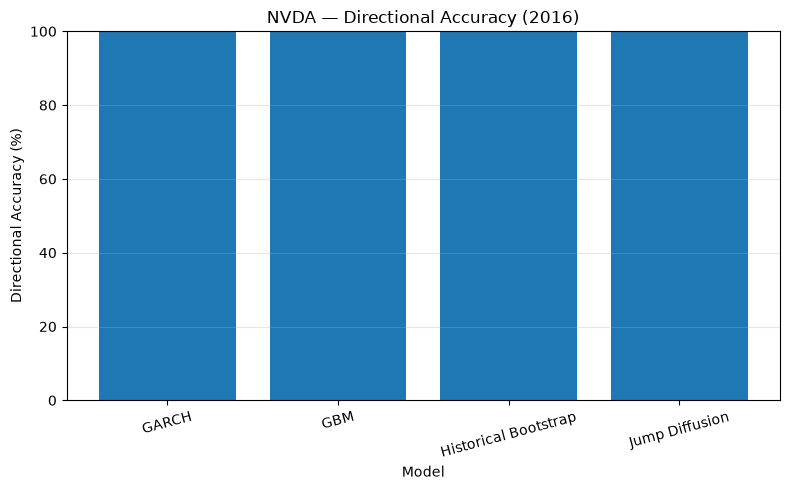

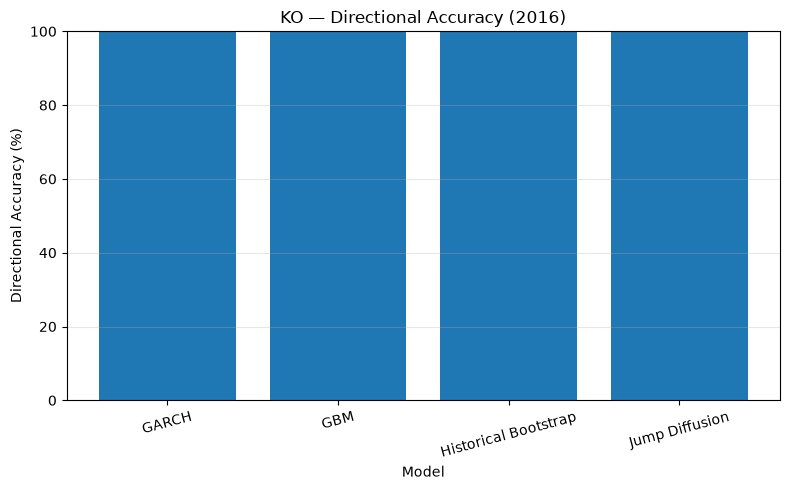

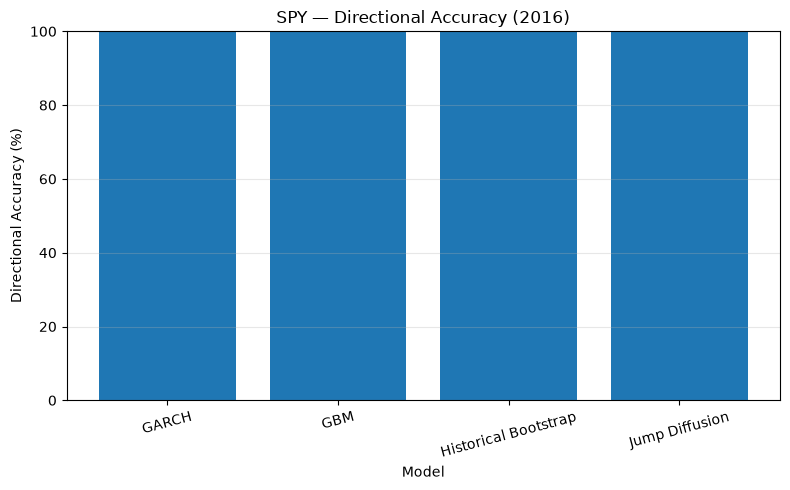

...

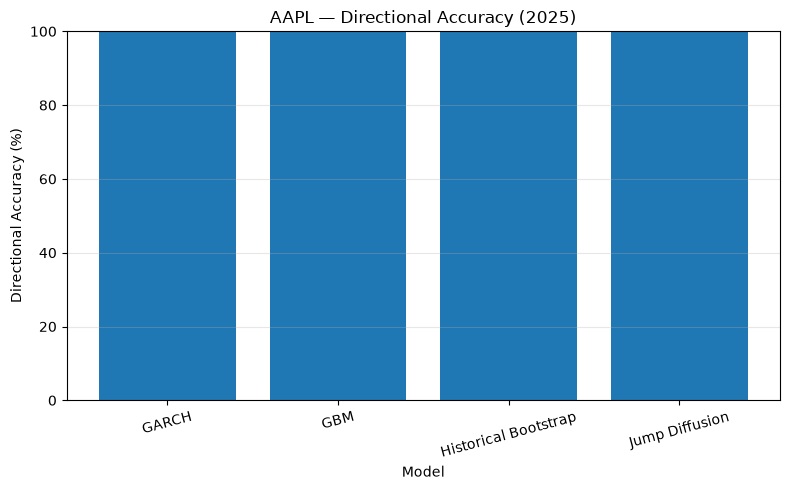

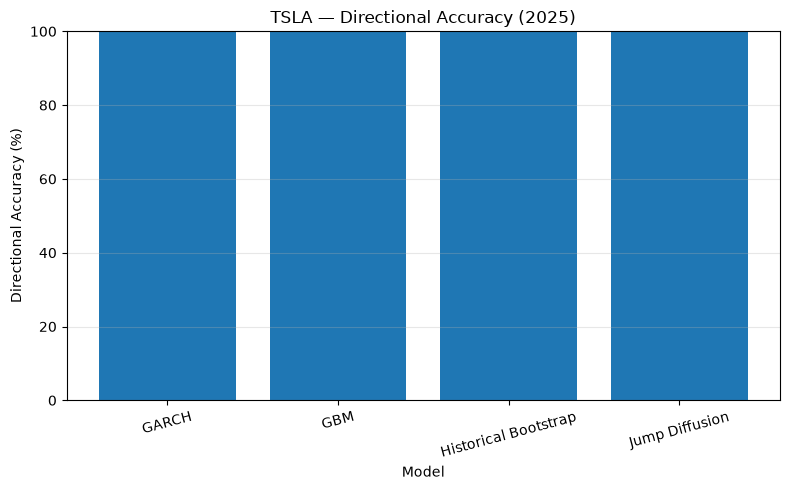

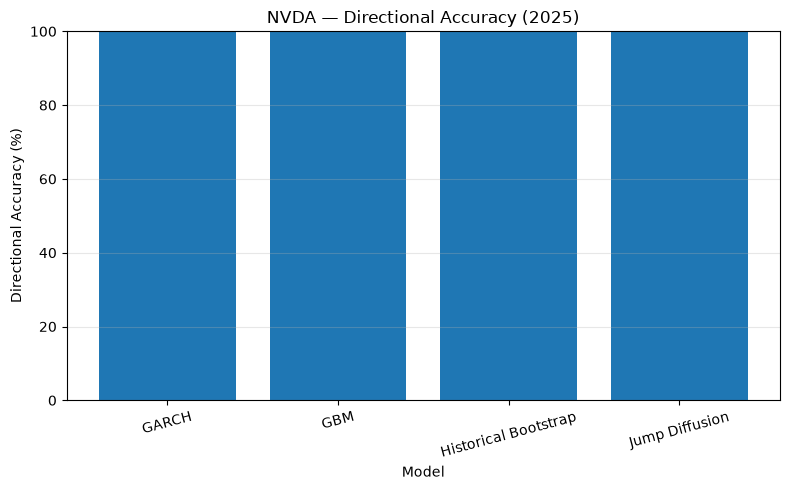

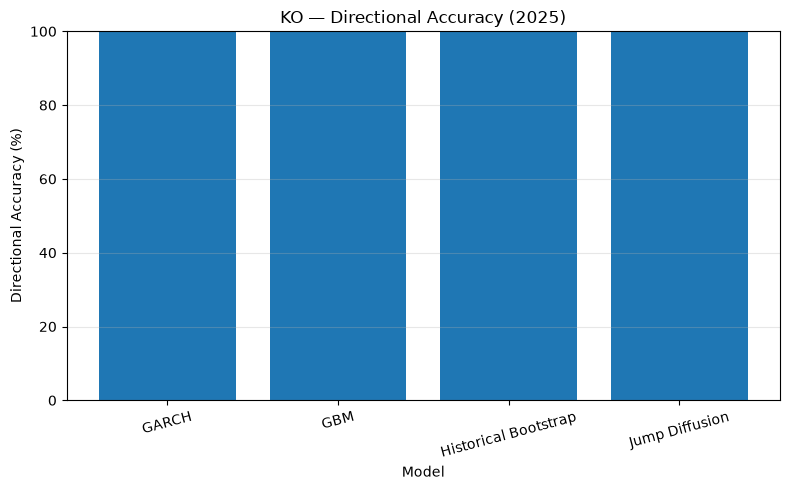

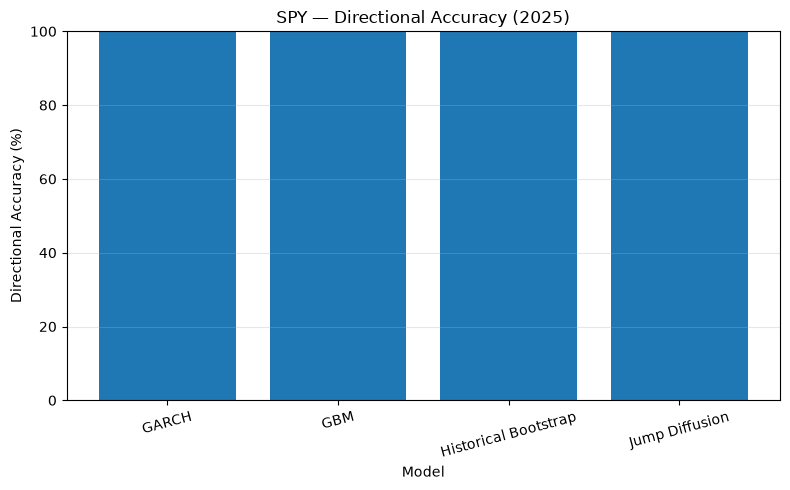

In [9]:
for year in years:
    for ticker in stocks:

        current = yearly_results[yearly_results["Ticker"] == ticker].copy()
        current = current[current["Year"] == year]
        current["Actual Direction"] = np.sign(current["Actual"] - current["S0"])
        current["Predicted Direction"] = np.sign(current["Predicted"] - current["S0"])
        current["Directional Accuracy (%)"] = (
            current["Actual Direction"] == current["Predicted Direction"]
        ).astype(float) * 100

        plt.figure(figsize=(8, 5))
        plt.bar(current["Model"], current["Directional Accuracy (%)"])
        plt.xlabel("Model")
        plt.ylabel("Directional Accuracy (%)")
        plt.title(f"{ticker} — Directional Accuracy ({year})")
        plt.xticks(rotation=15)
        plt.ylim(0, 100)
        plt.grid(axis="y", alpha=0.3)
        plt.tight_layout()
        plt.show()


## 7. Value at Risk (VaR) by year

The 5% VaR is shown separately for each selected evaluation year.


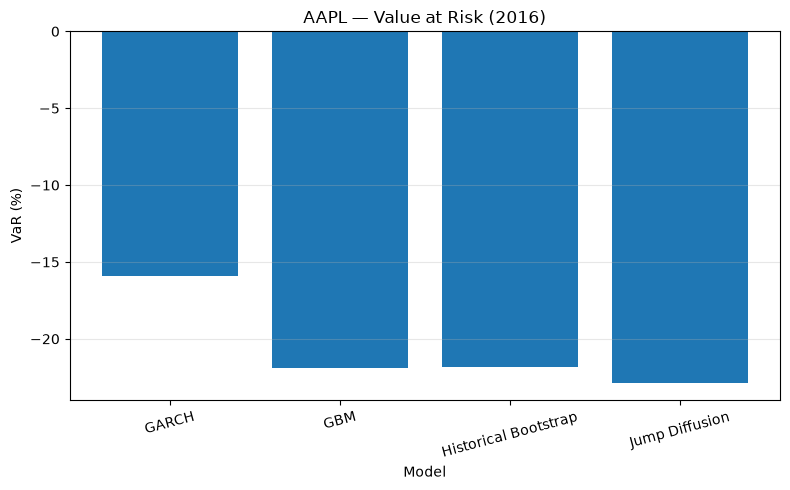

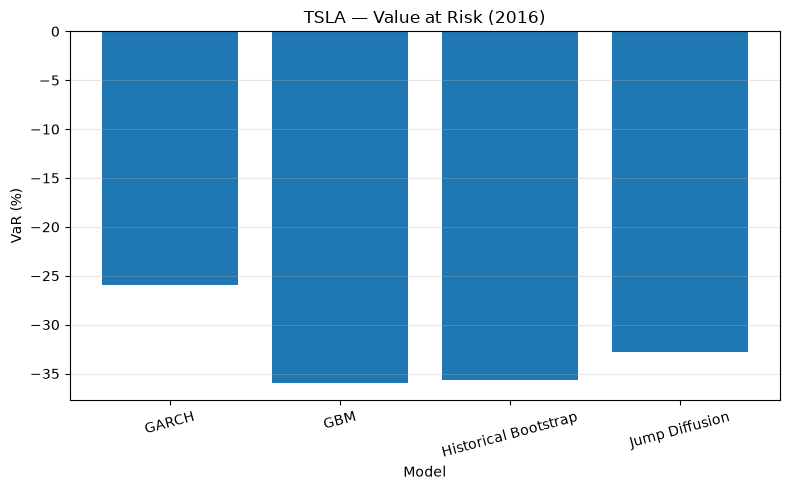

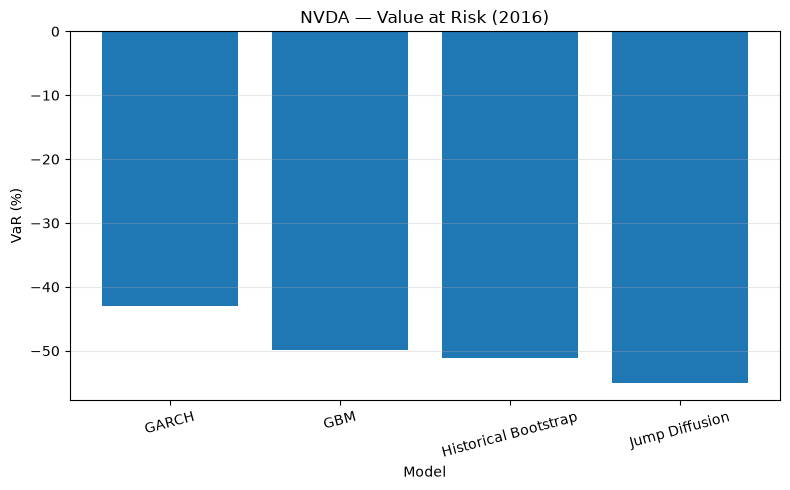

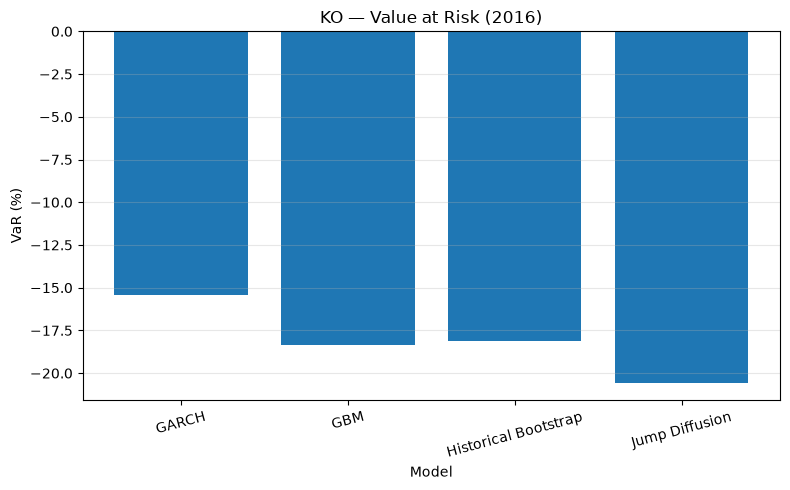

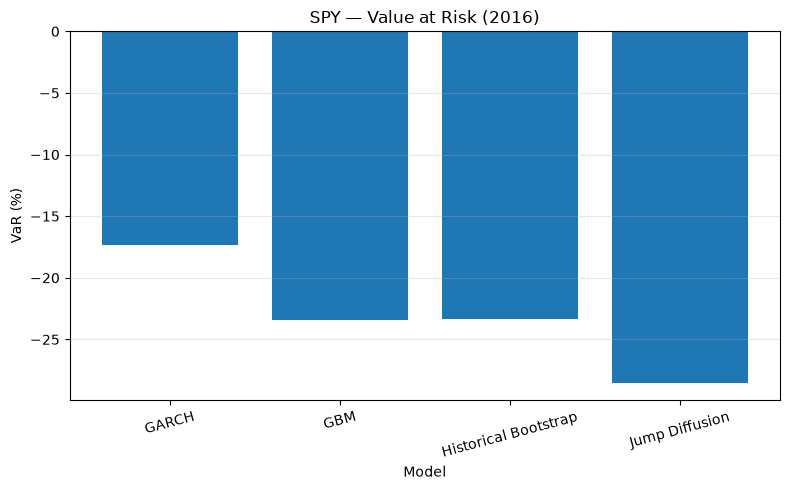

...

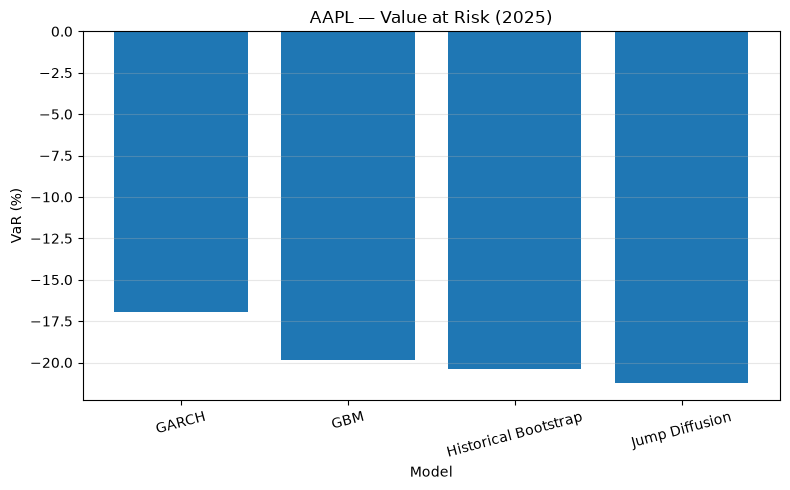

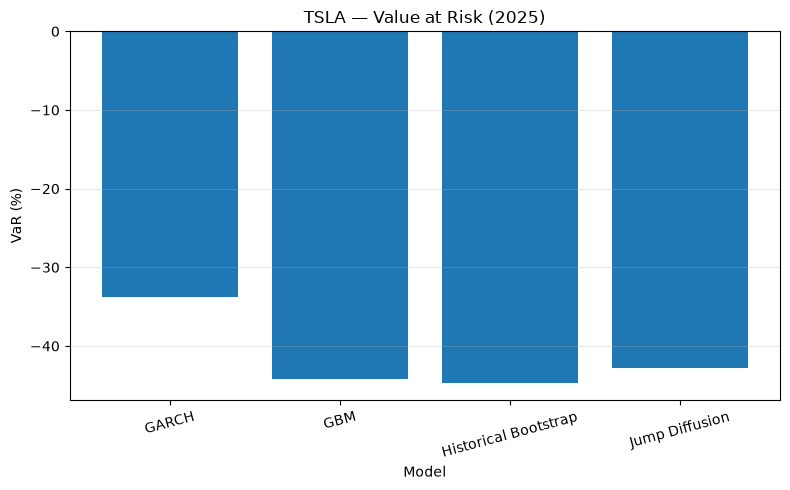

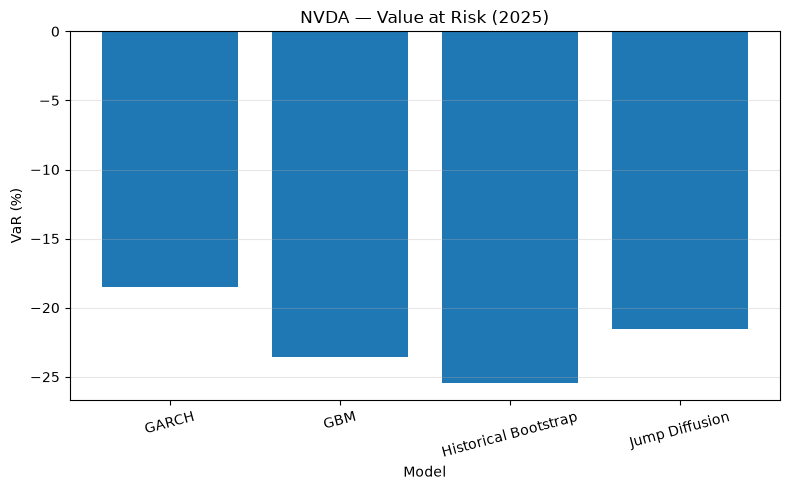

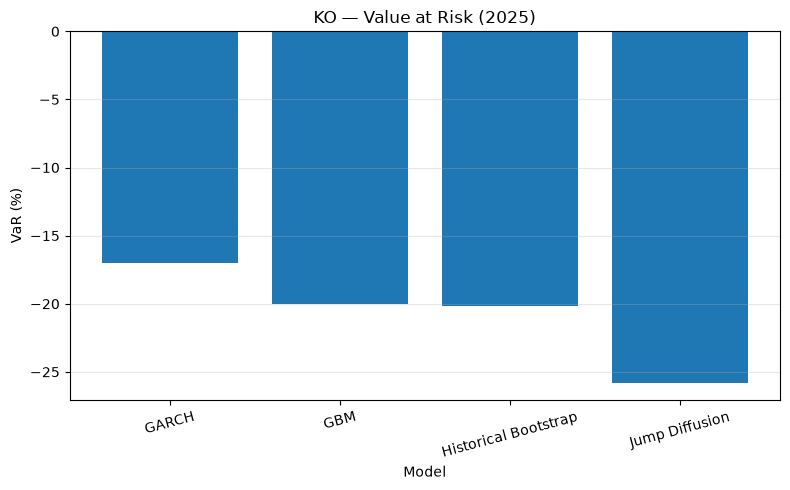

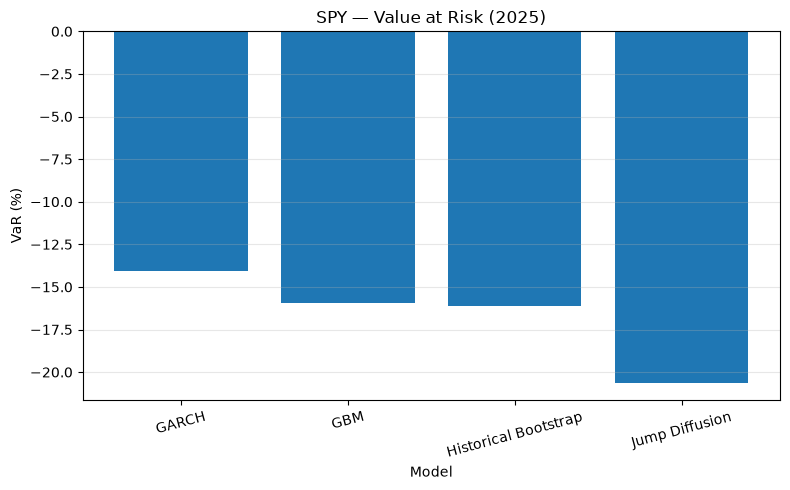

In [10]:
for year in years:
    for ticker in stocks:

        current = yearly_results[
            (yearly_results["Ticker"] == ticker) &
            (yearly_results["Year"] == year)
        ].copy()

        plt.figure(figsize=(8, 5))
        plt.bar(current["Model"], current["VaR (%)"])
        plt.xlabel("Model")
        plt.ylabel("VaR (%)")
        plt.title(f"{ticker} — Value at Risk ({year})")
        plt.xticks(rotation=15)
        plt.grid(axis="y", alpha=0.3)
        plt.tight_layout()
        plt.show()


## 8. Expected Shortfall (ES) by year

Expected Shortfall is shown separately for each selected evaluation year.


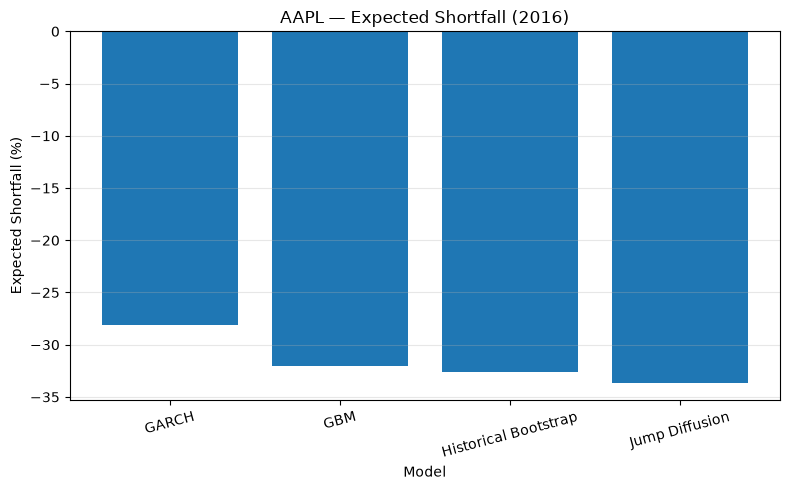

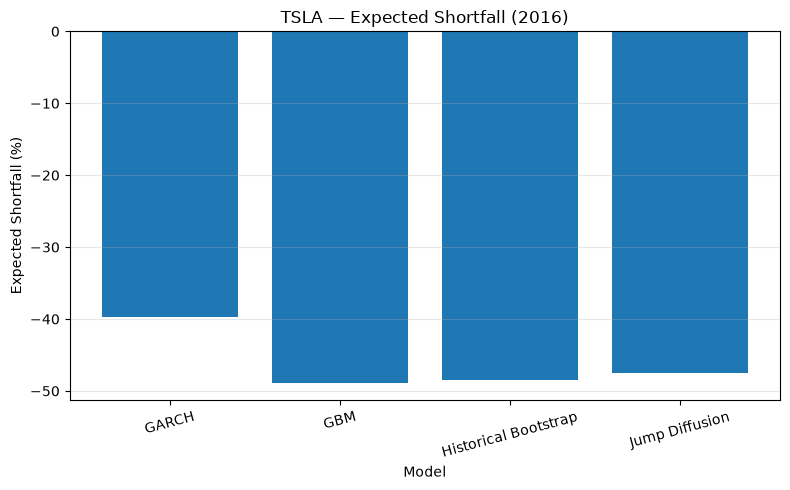

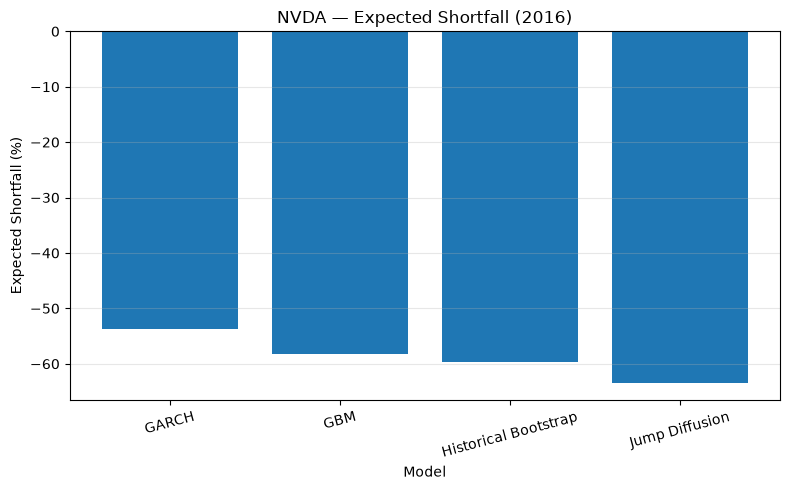

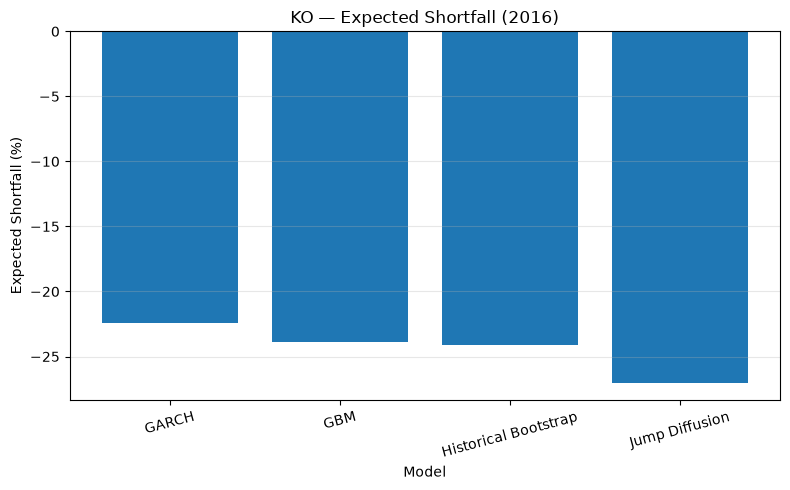

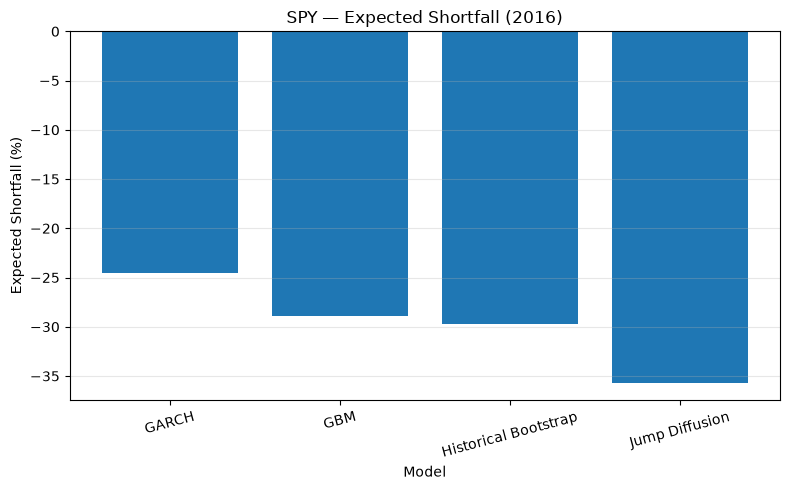

...

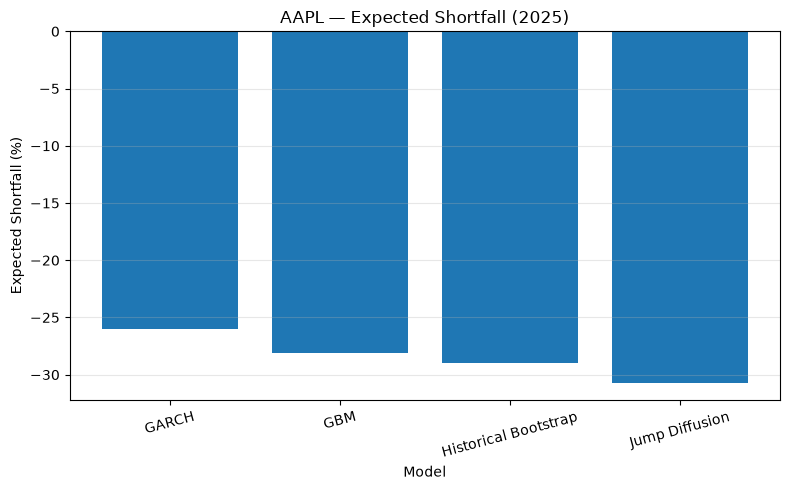

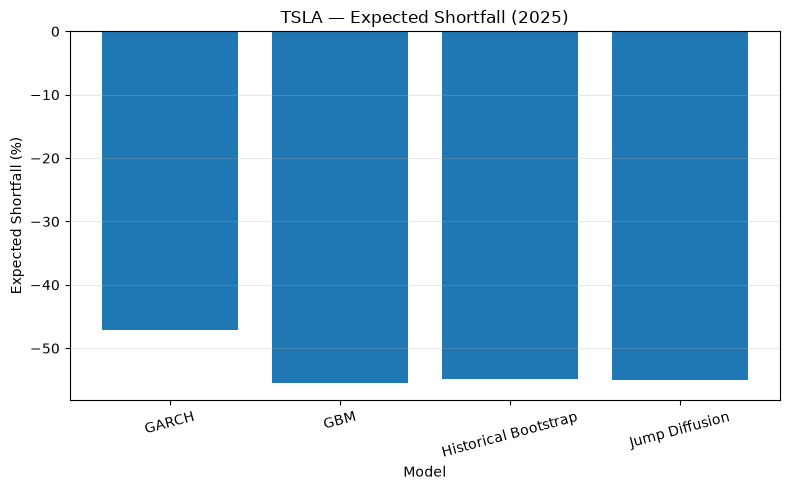

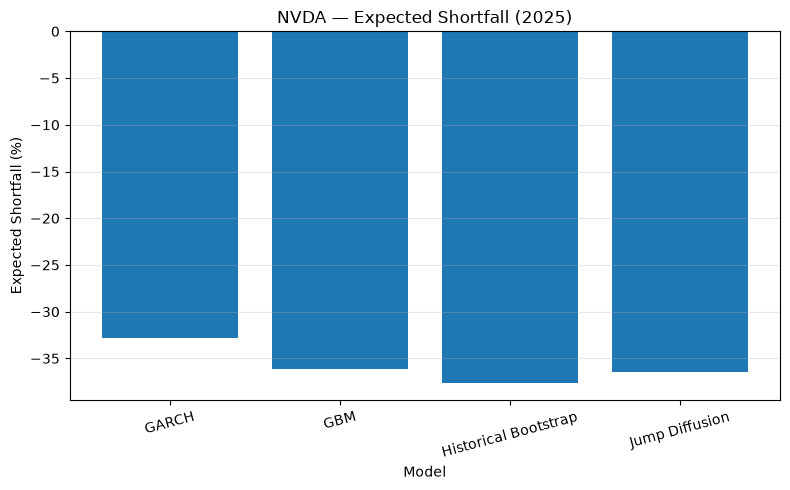

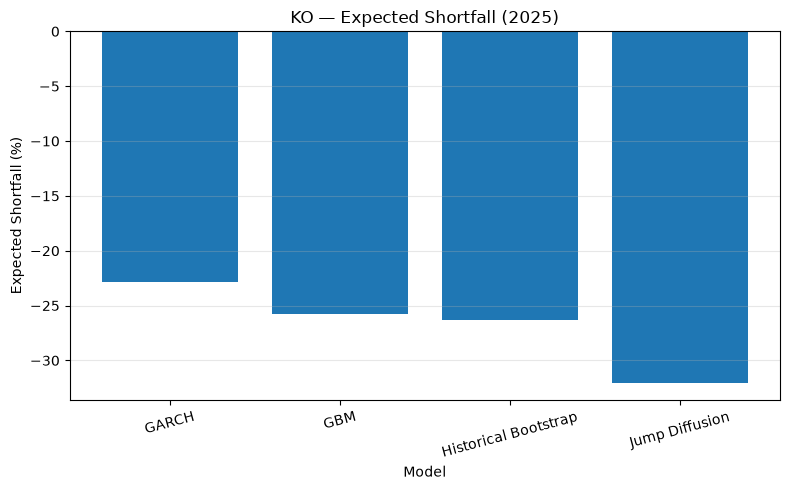

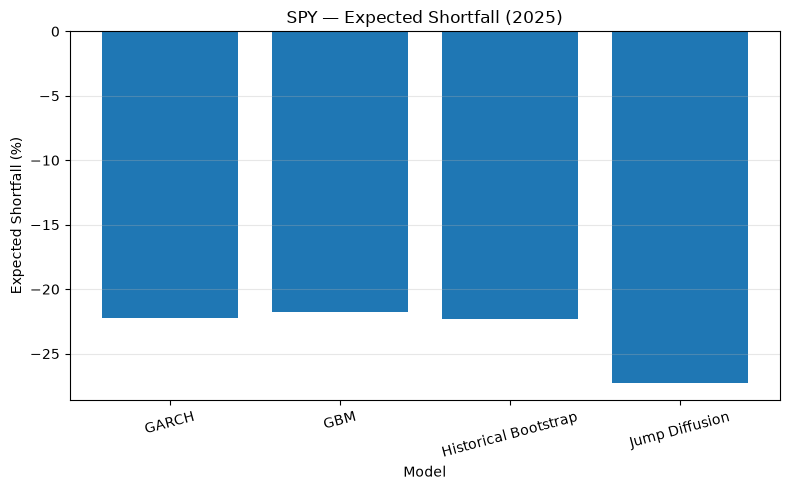

In [11]:
for year in years:
    for ticker in stocks:

        current = yearly_results[
            (yearly_results["Ticker"] == ticker) &
            (yearly_results["Year"] == year)
        ].copy()

        plt.figure(figsize=(8, 5))
        plt.bar(current["Model"], current["ES (%)"])
        plt.xlabel("Model")
        plt.ylabel("Expected Shortfall (%)")
        plt.title(f"{ticker} — Expected Shortfall ({year})")
        plt.xticks(rotation=15)
        plt.grid(axis="y", alpha=0.3)
        plt.tight_layout()
        plt.show()


## 9. Probability Up vs actual outcome

Each graph shows the model predictions for one selected evaluation year.


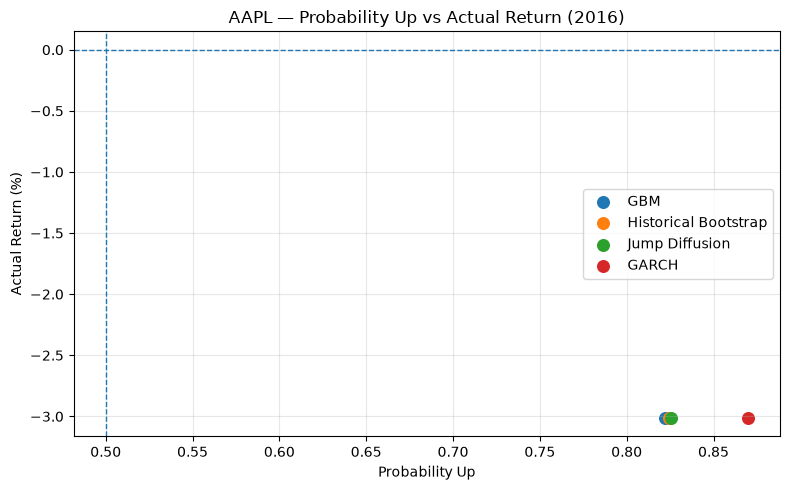

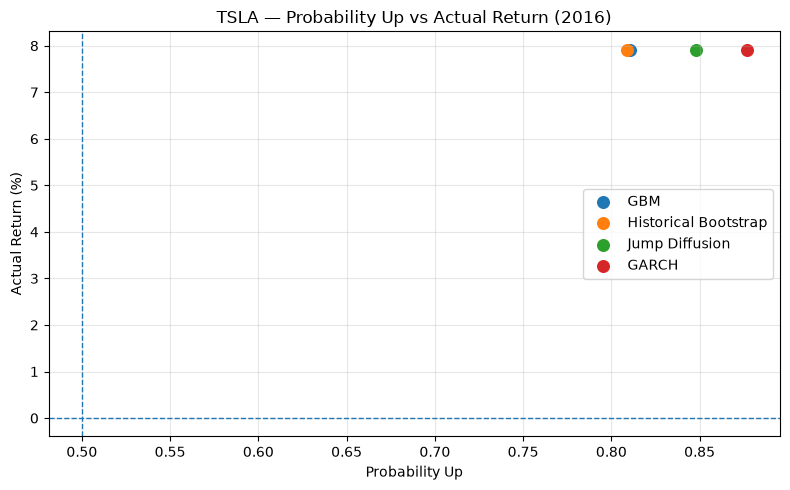

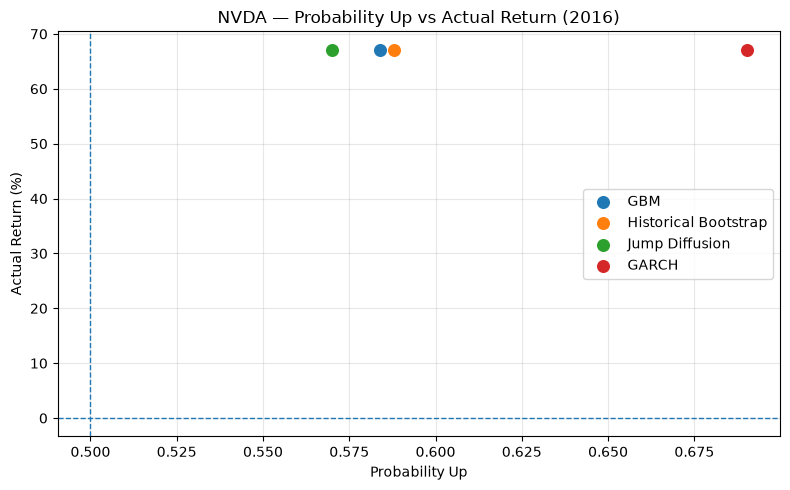

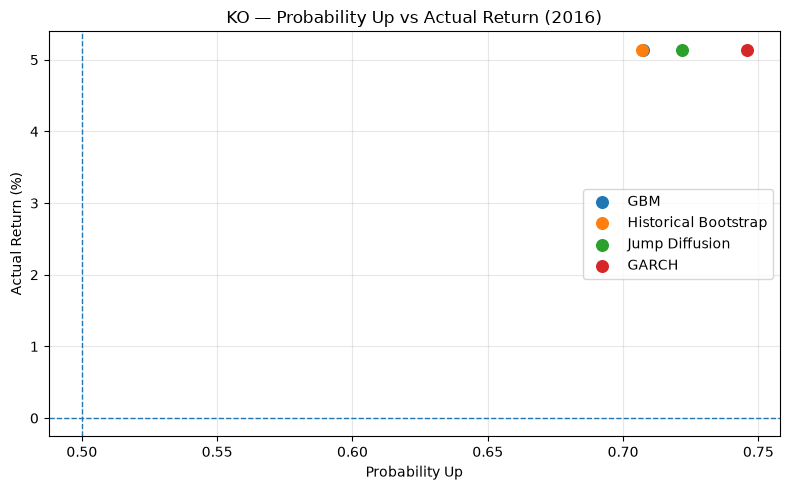

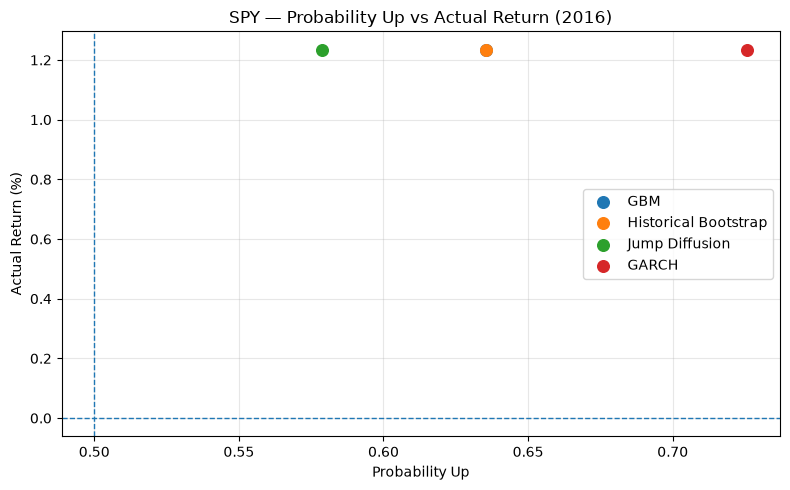

...

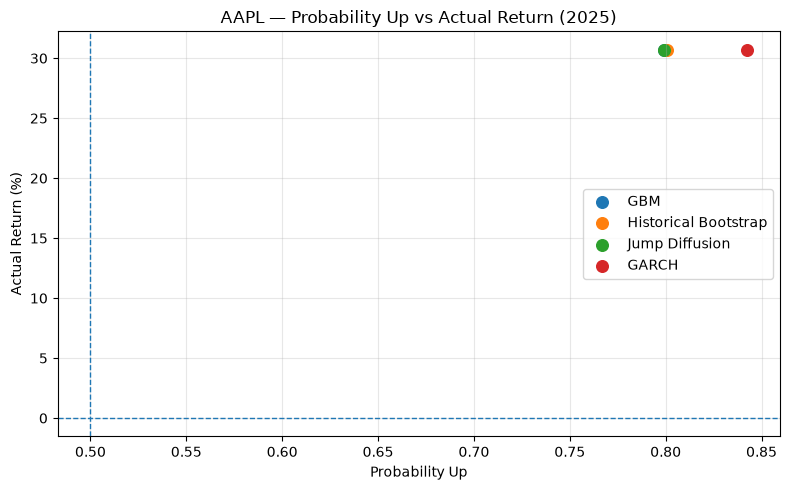

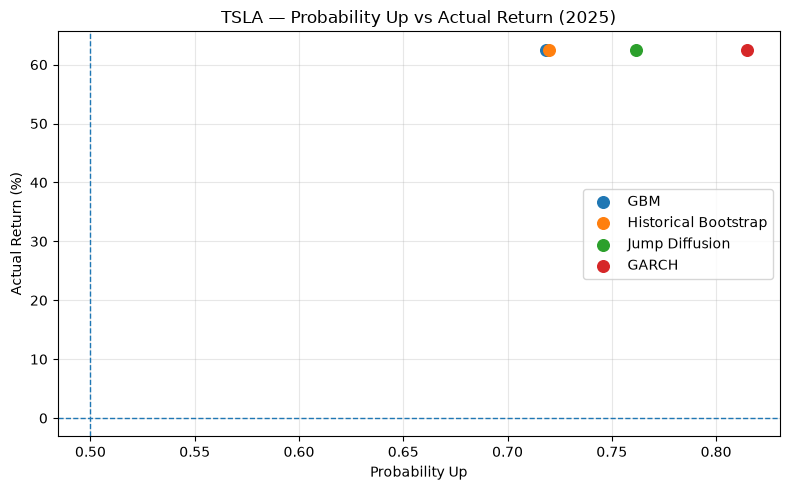

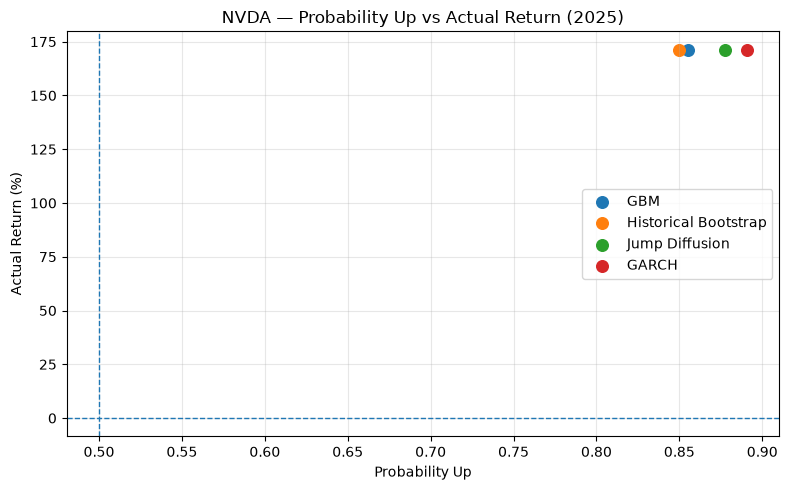

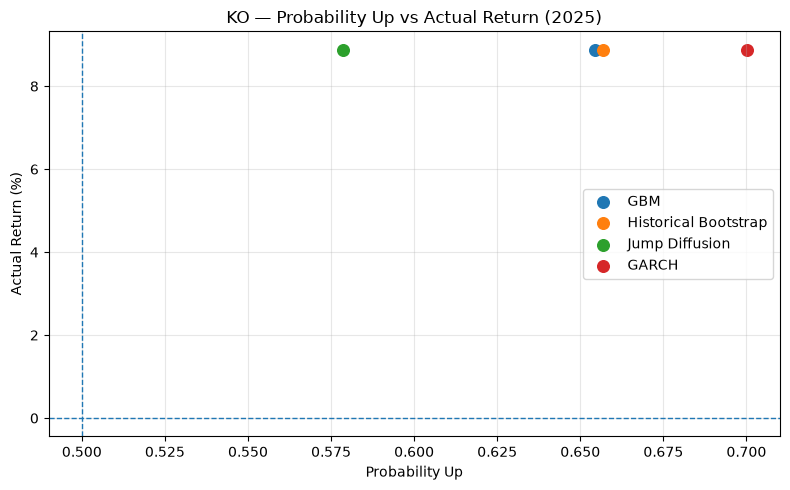

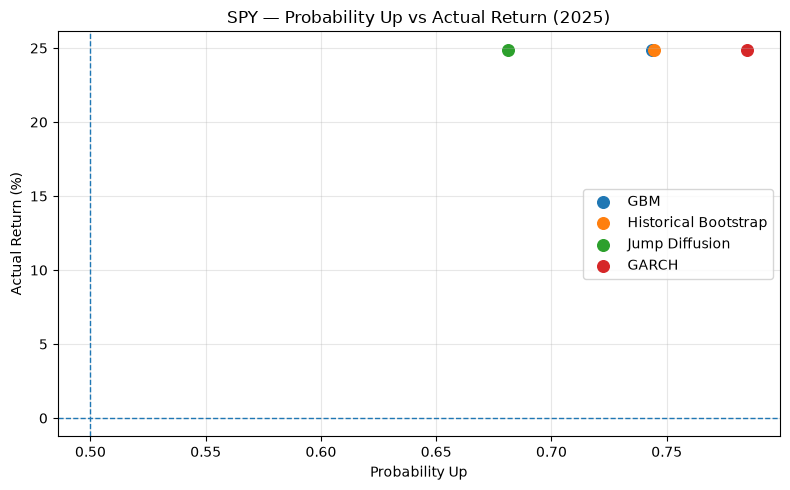

In [12]:
for year in years:
    for ticker in stocks:

        current = yearly_results[
            (yearly_results["Ticker"] == ticker) &
            (yearly_results["Year"] == year)
        ].copy()

        plt.figure(figsize=(8, 5))

        for model in models:
            data = current[current["Model"] == model]
            plt.scatter(
                data["Probability Up"],
                data["Actual Return (%)"],
                s=70,
                label=model
            )

        plt.axvline(0.5, linestyle="--", linewidth=1)
        plt.axhline(0, linestyle="--", linewidth=1)
        plt.xlabel("Probability Up")
        plt.ylabel("Actual Return (%)")
        plt.title(f"{ticker} — Probability Up vs Actual Return ({year})")
        plt.legend()
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()


## 10. Strategy return by year — grouped bar charts

For each selected year and stock, compare the return produced by each strategy for each model.


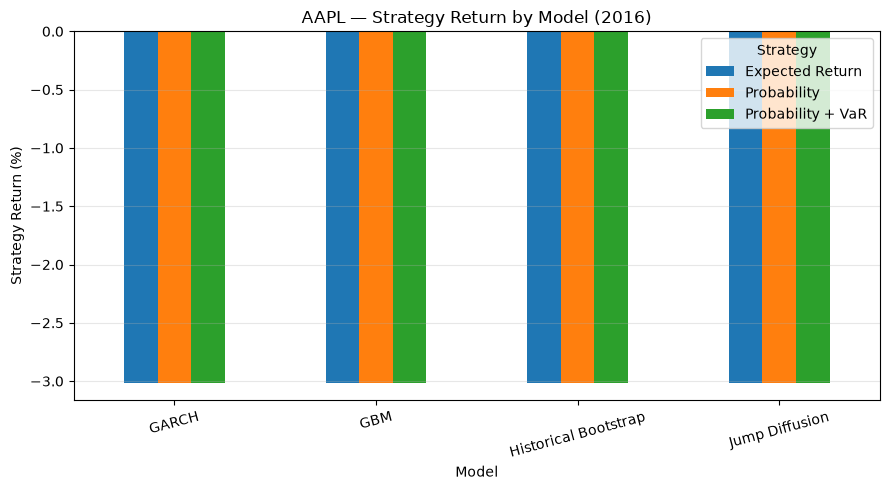

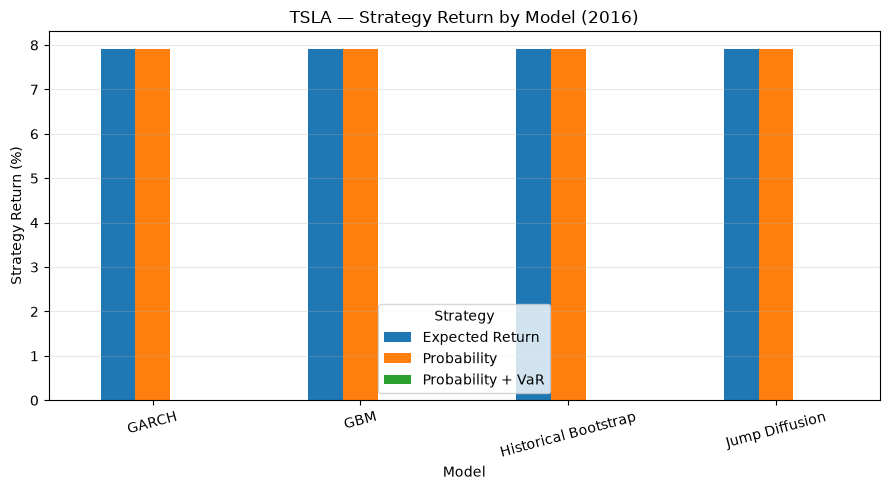

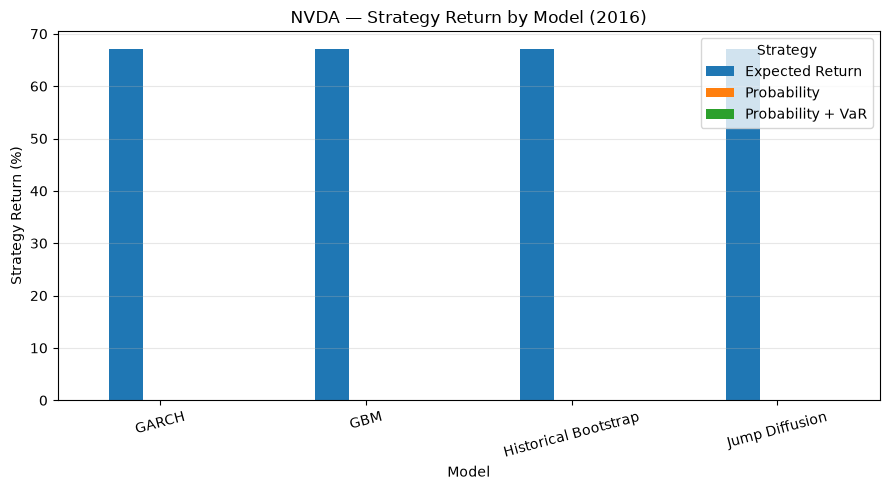

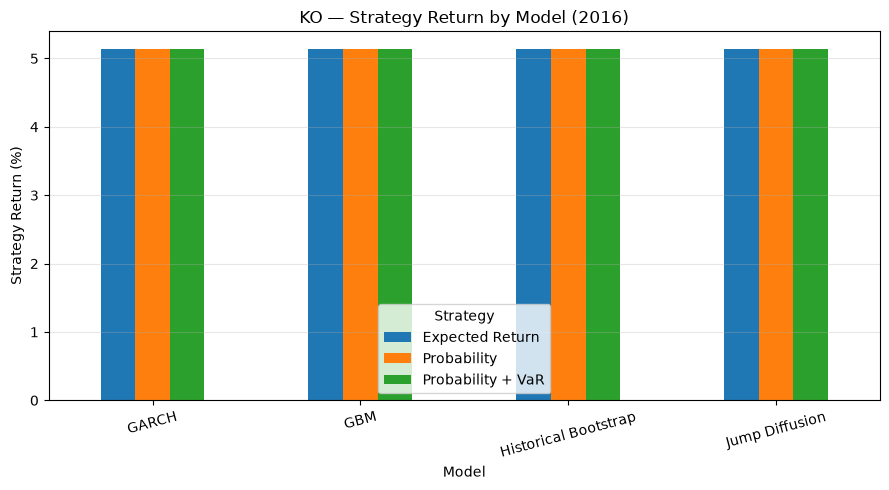

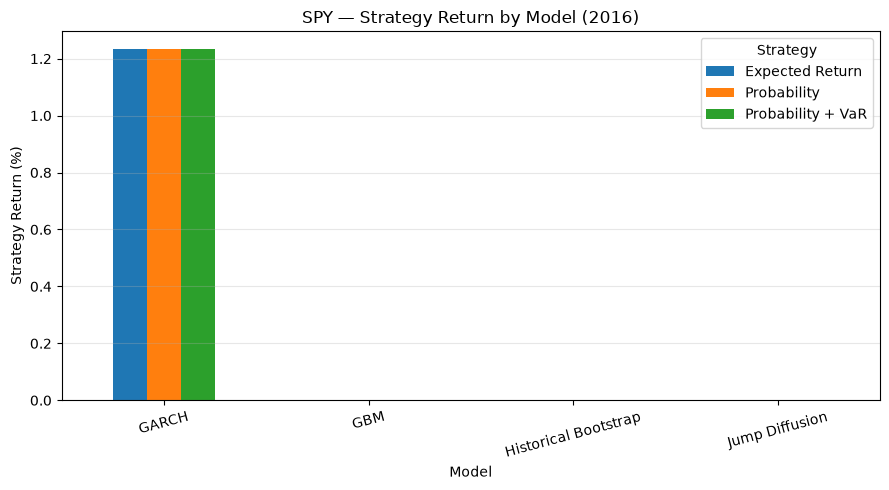

...

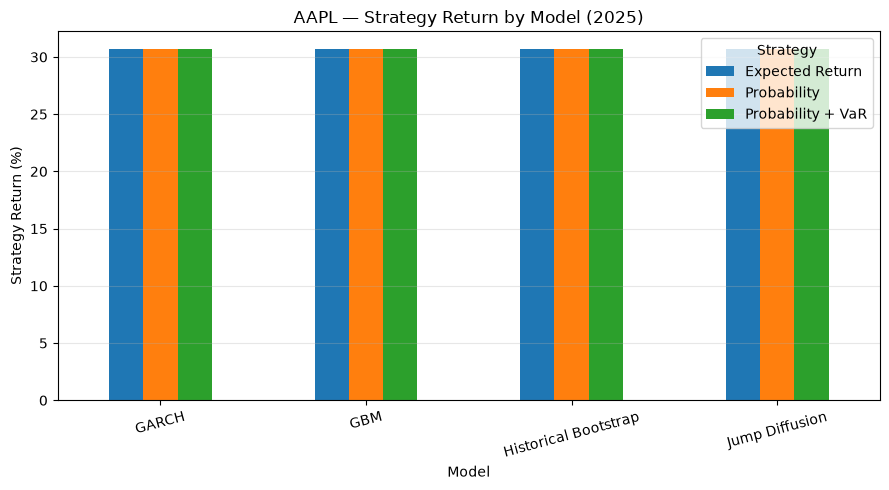

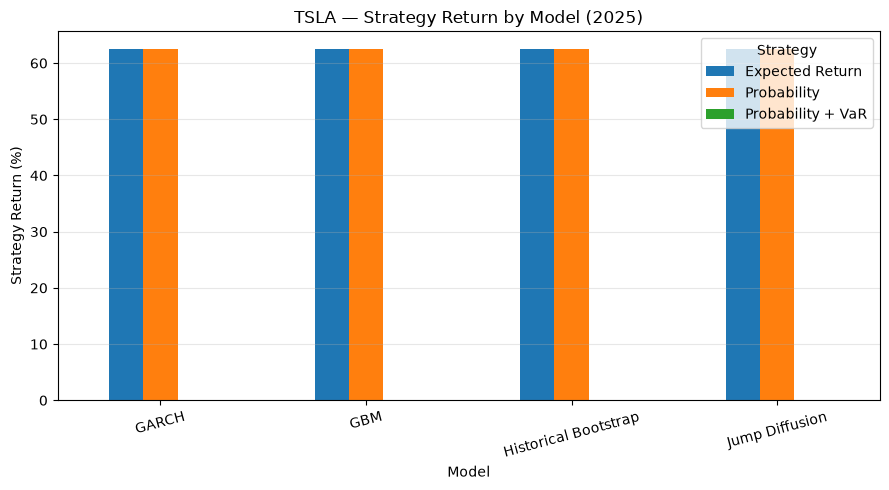

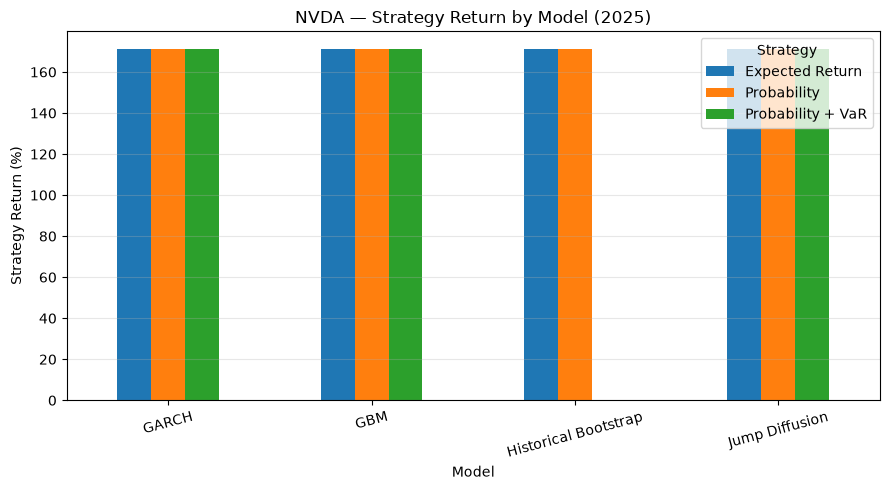

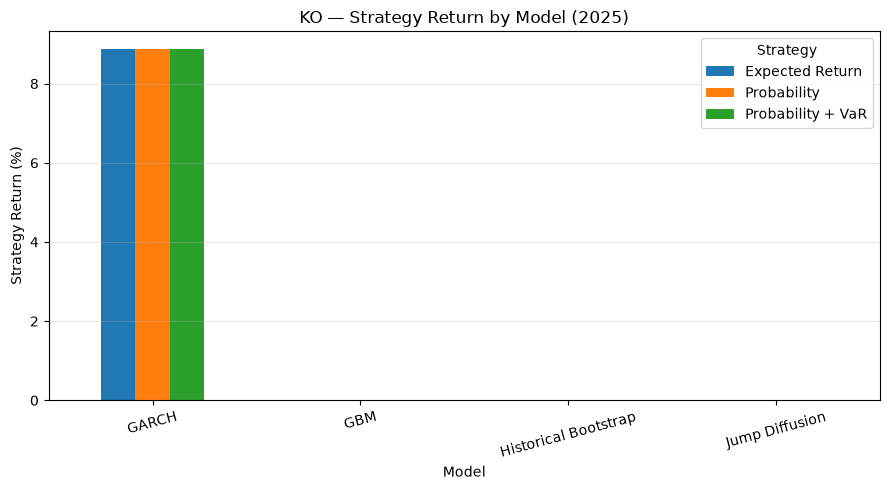

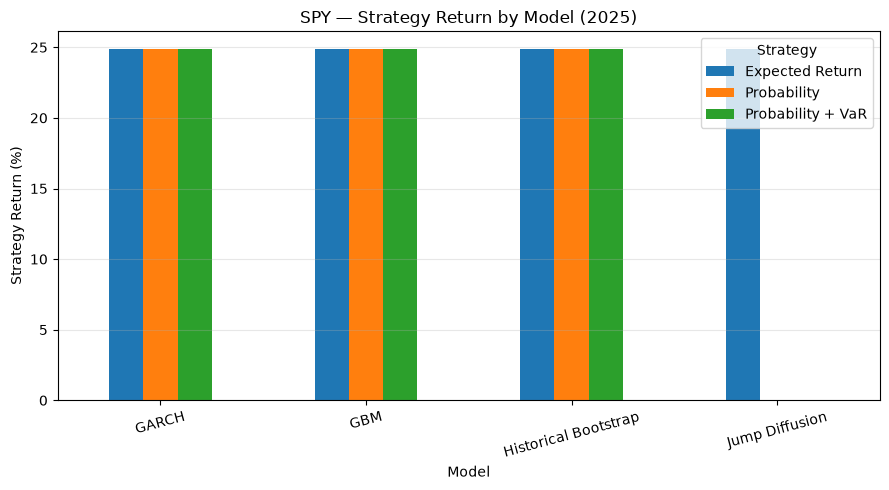

In [13]:
for year in years:
    current_year = strategy_results[strategy_results["Year"] == year]

    for ticker in stocks:

        current = current_year[current_year["Ticker"] == ticker]

        pivot = current.pivot(
            index="Model",
            columns="Strategy",
            values="Strategy Return (%)"
        )

        ax = pivot.plot(kind="bar", figsize=(9, 5))
        ax.set_xlabel("Model")
        ax.set_ylabel("Strategy Return (%)")
        ax.set_title(f"{ticker} — Strategy Return by Model ({year})")
        plt.xticks(rotation=15)
        plt.grid(axis="y", alpha=0.3)
        plt.legend(title="Strategy")
        plt.tight_layout()
        plt.show()


## 11. Strategy performance by selected year

This shows the strategy return for each selected year rather than compounding across all years.


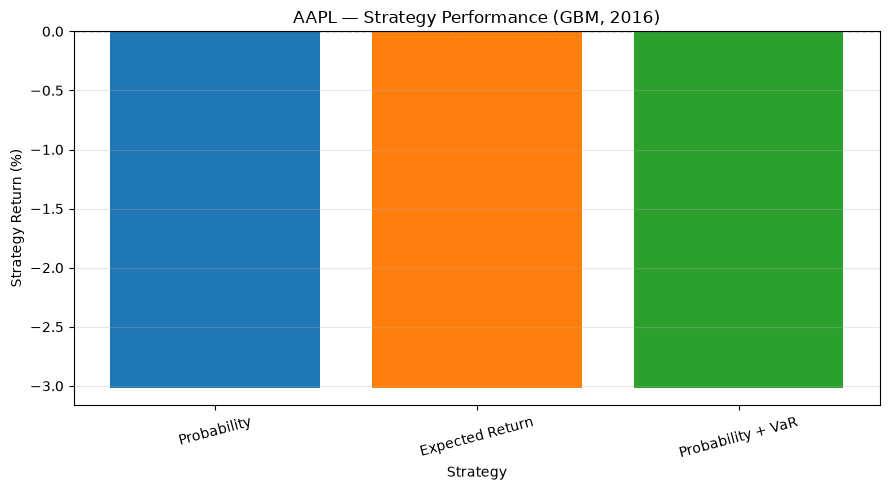

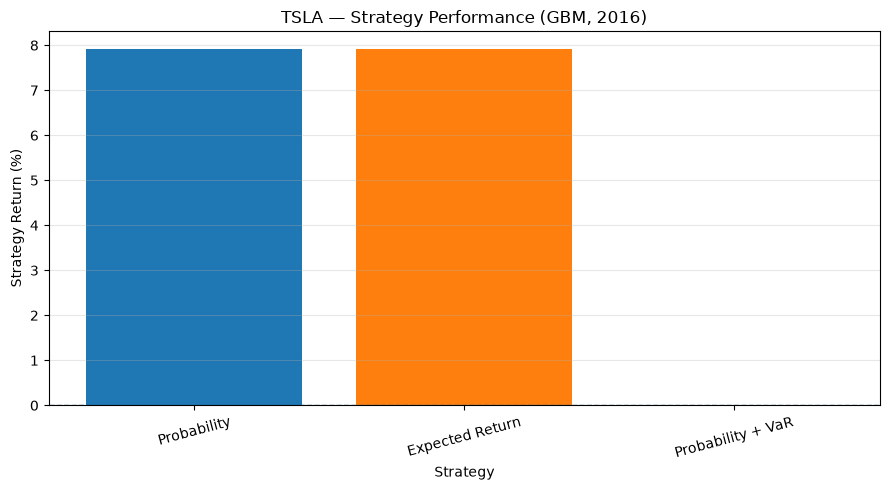

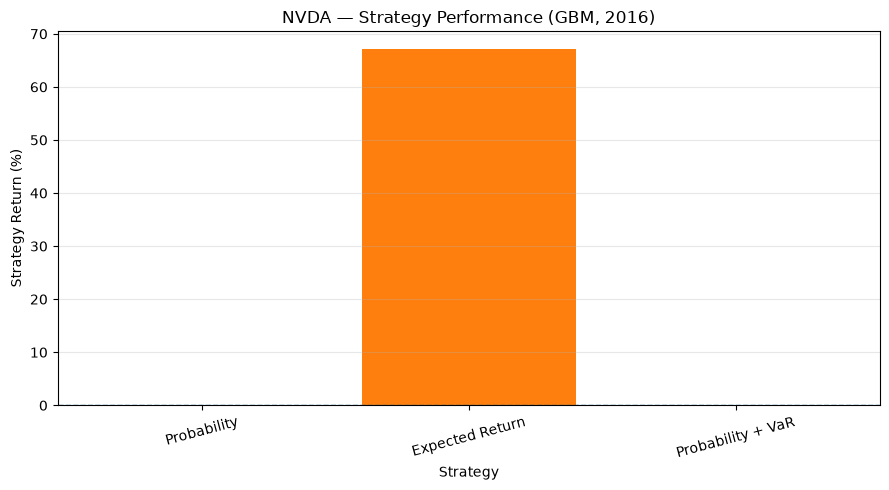

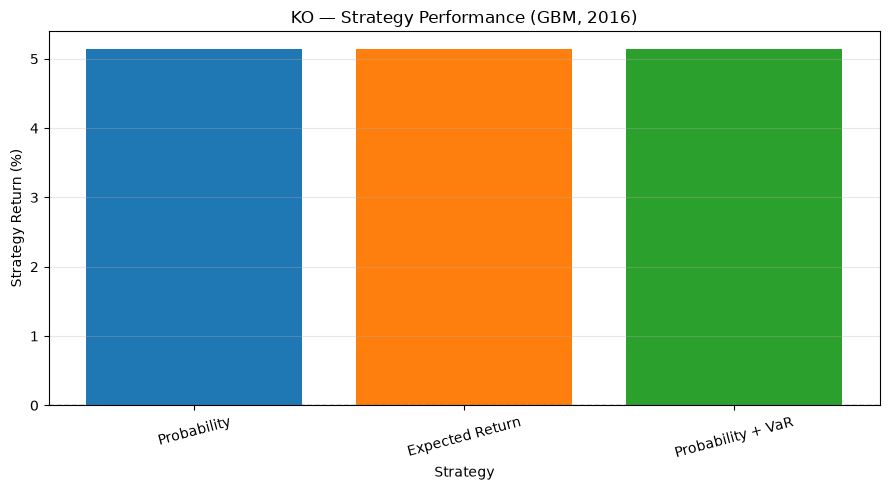

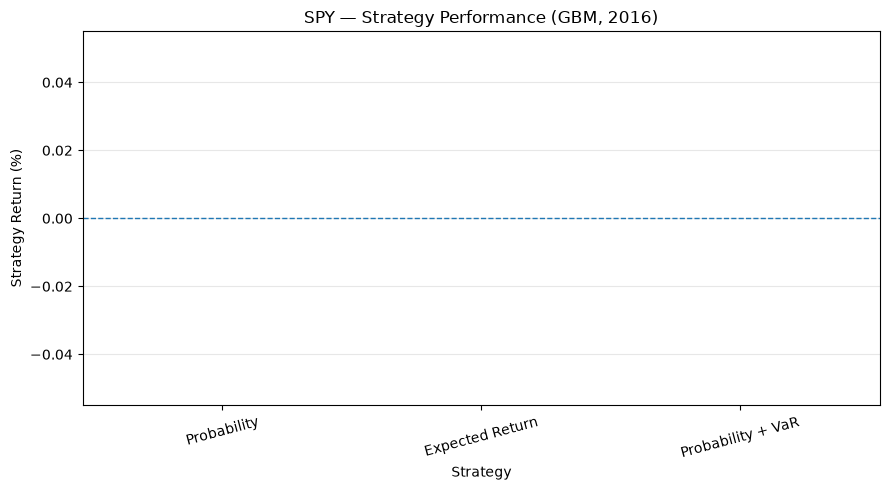

...

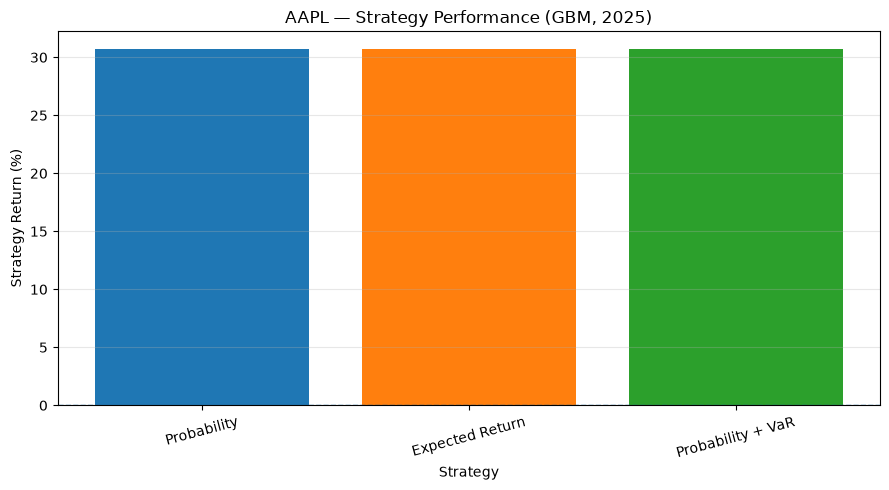

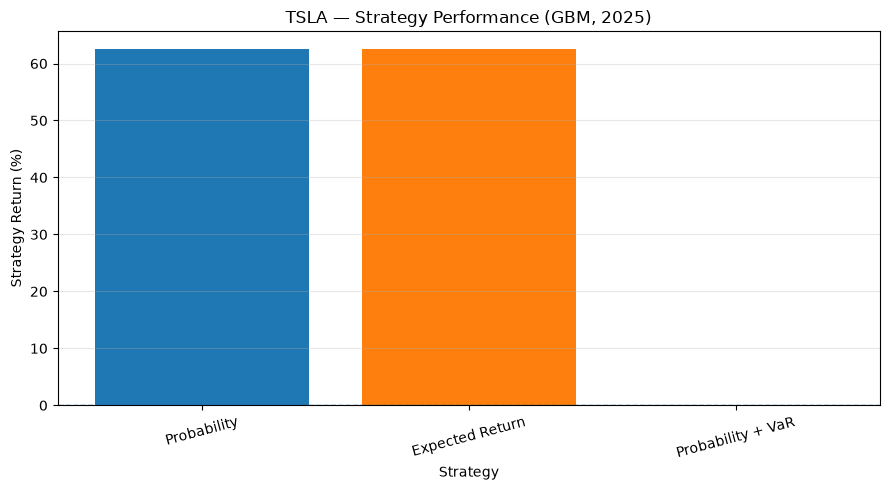

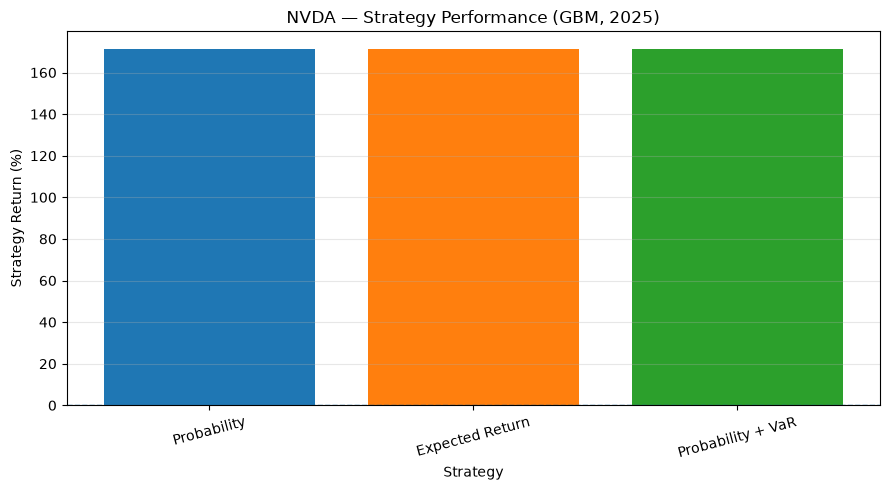

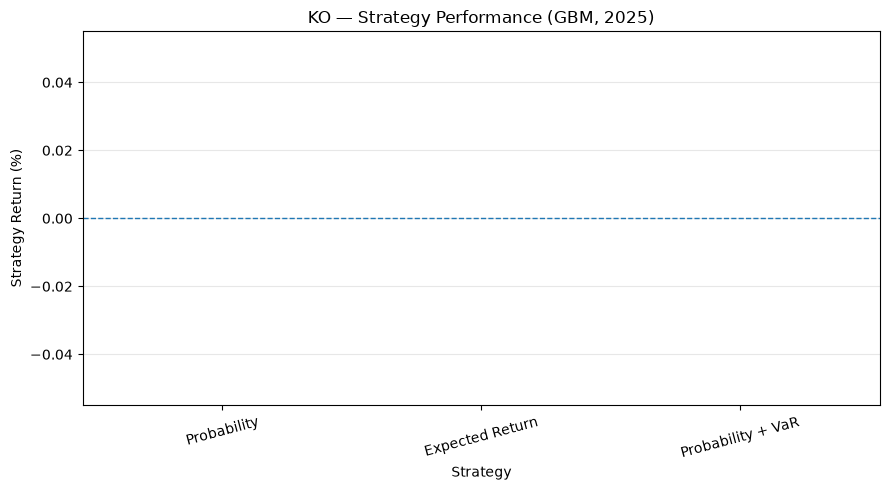

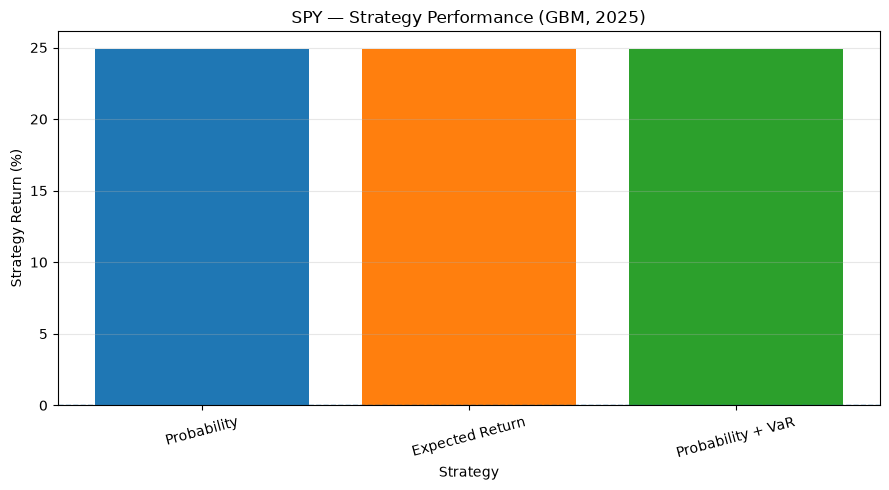

In [14]:
for year in years:
    for ticker in stocks:

        current = strategy_results[
            (strategy_results["Ticker"] == ticker) &
            (strategy_results["Model"] == "GBM") &
            (strategy_results["Year"] == year)
        ].copy()

        plt.figure(figsize=(9, 5))

        for strategy in strategies:
            data = current[current["Strategy"] == strategy]
            if data.empty:
                continue
            plt.bar(
                strategy,
                data["Strategy Return (%)"].iloc[0]
            )

        plt.axhline(0, linestyle="--", linewidth=1)
        plt.xlabel("Strategy")
        plt.ylabel("Strategy Return (%)")
        plt.title(f"{ticker} — Strategy Performance (GBM, {year})")
        plt.xticks(rotation=15)
        plt.grid(axis="y", alpha=0.3)
        plt.tight_layout()
        plt.show()


## 12. Risk–return comparison by year

Compare strategy return with Expected Shortfall separately for each selected evaluation year.


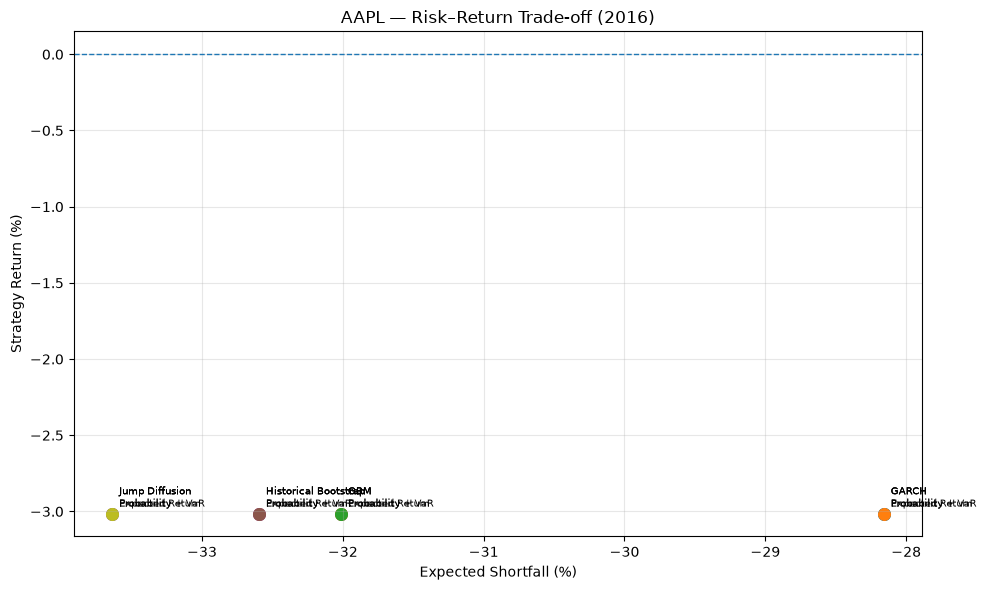

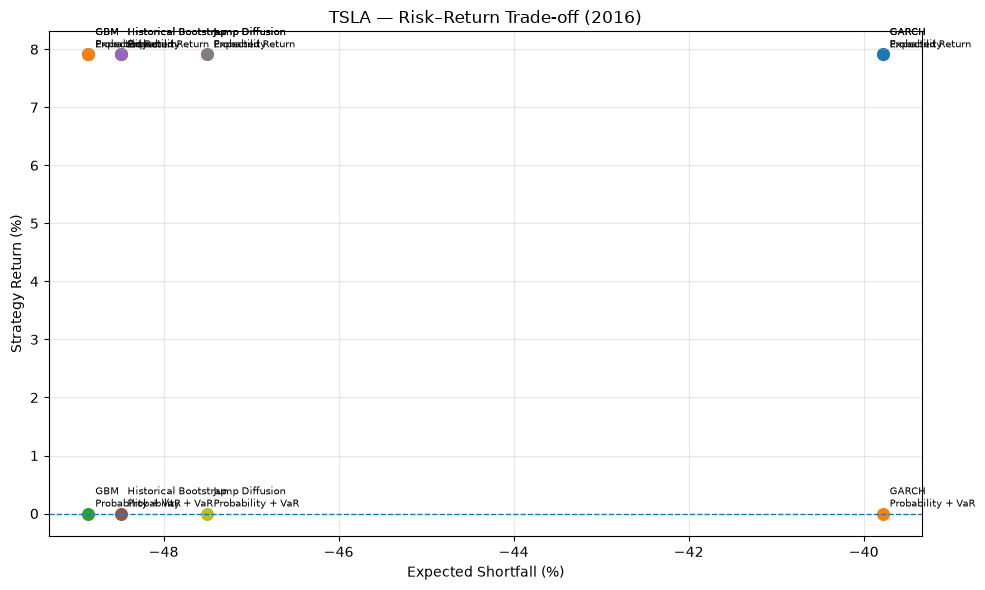

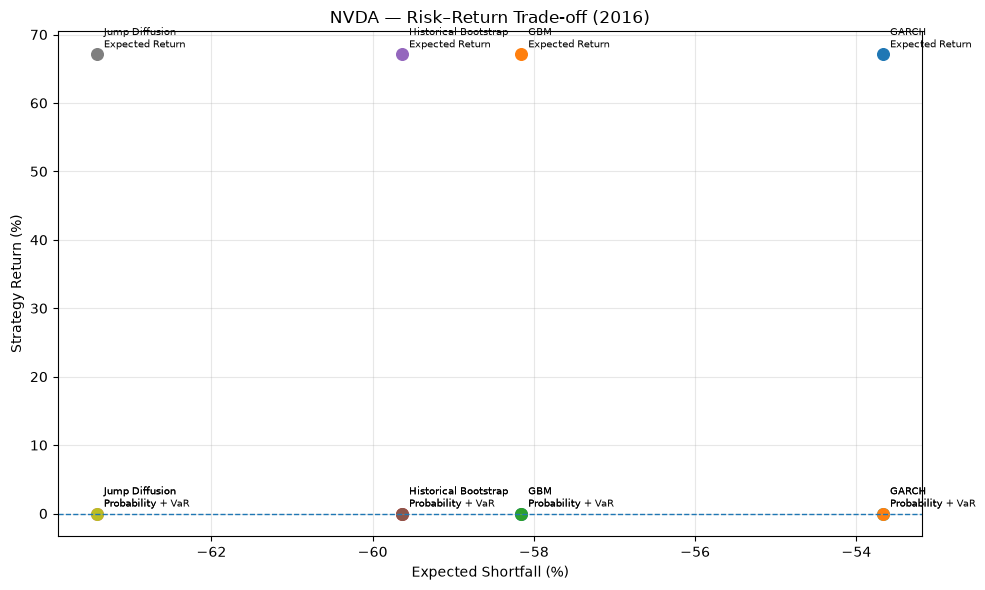

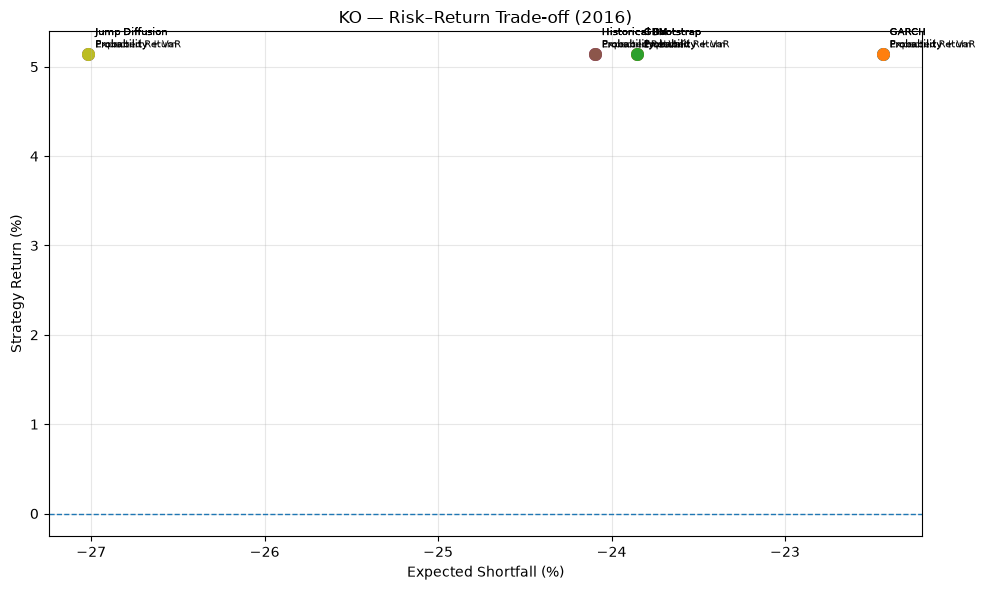

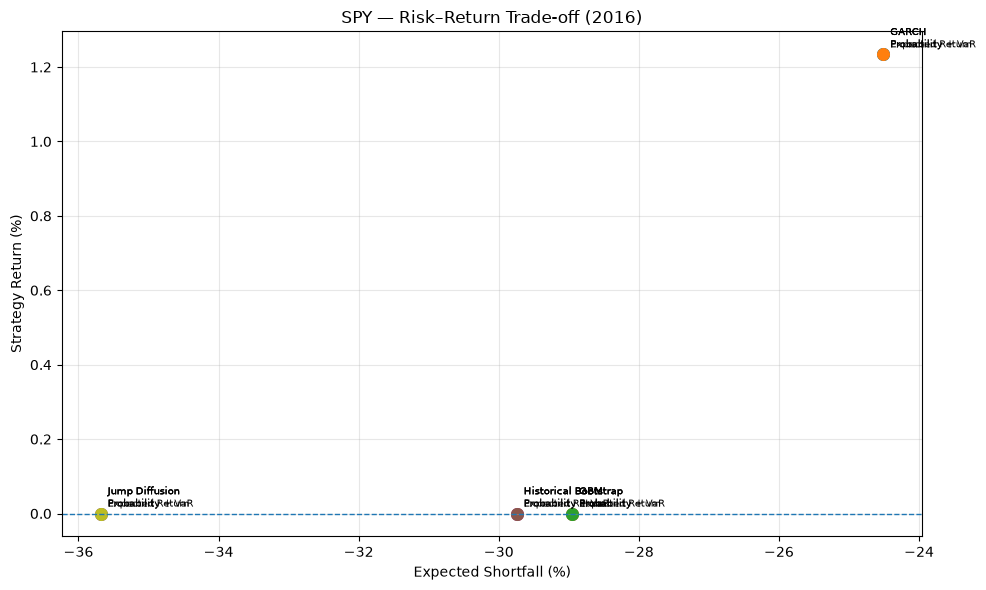

...

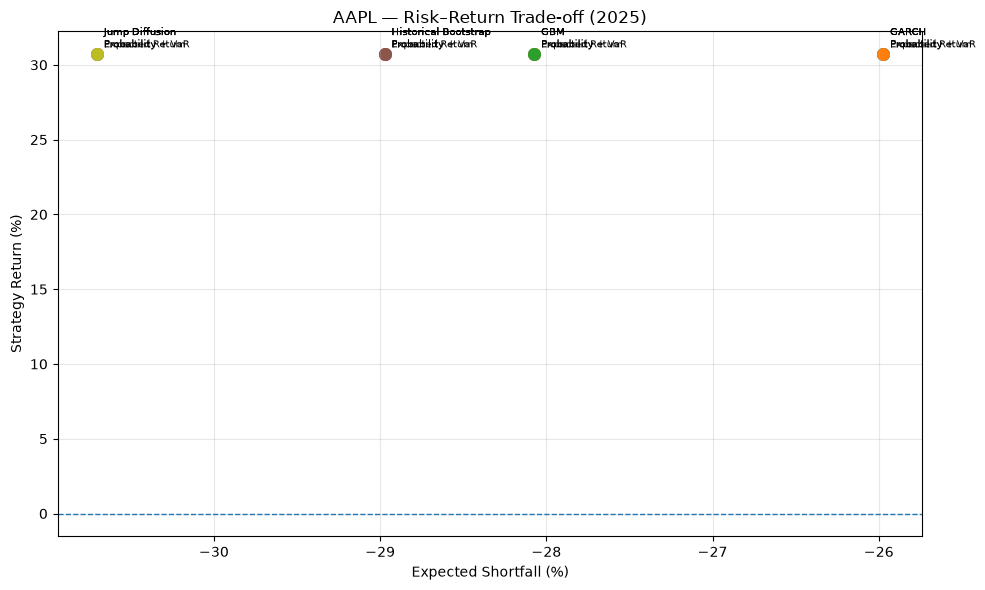

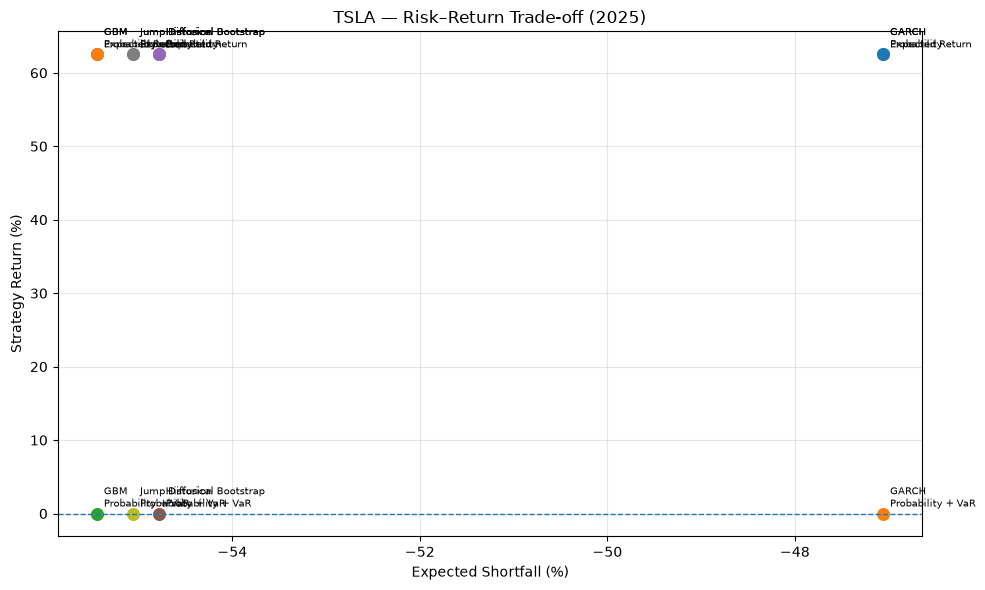

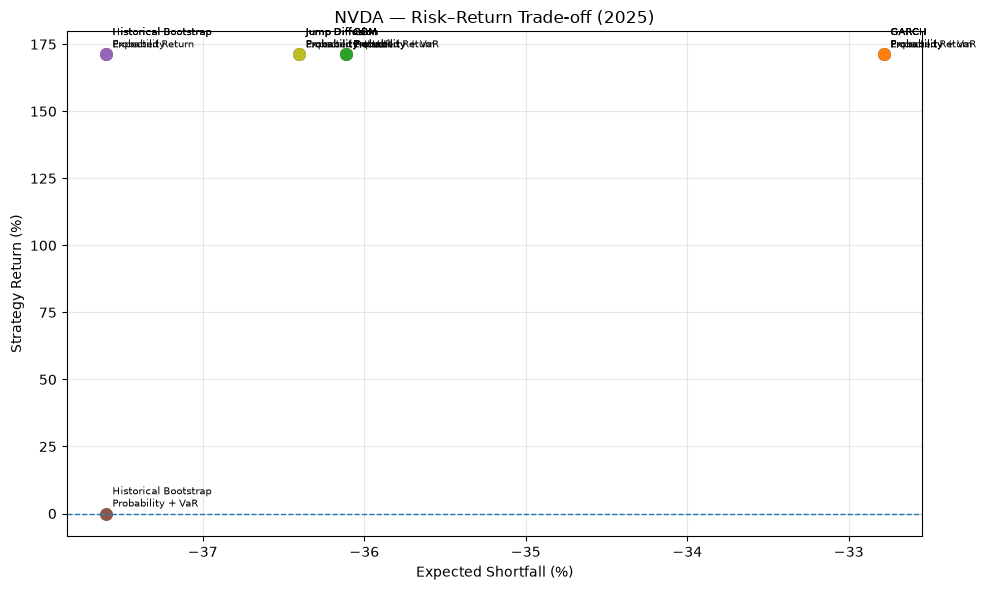

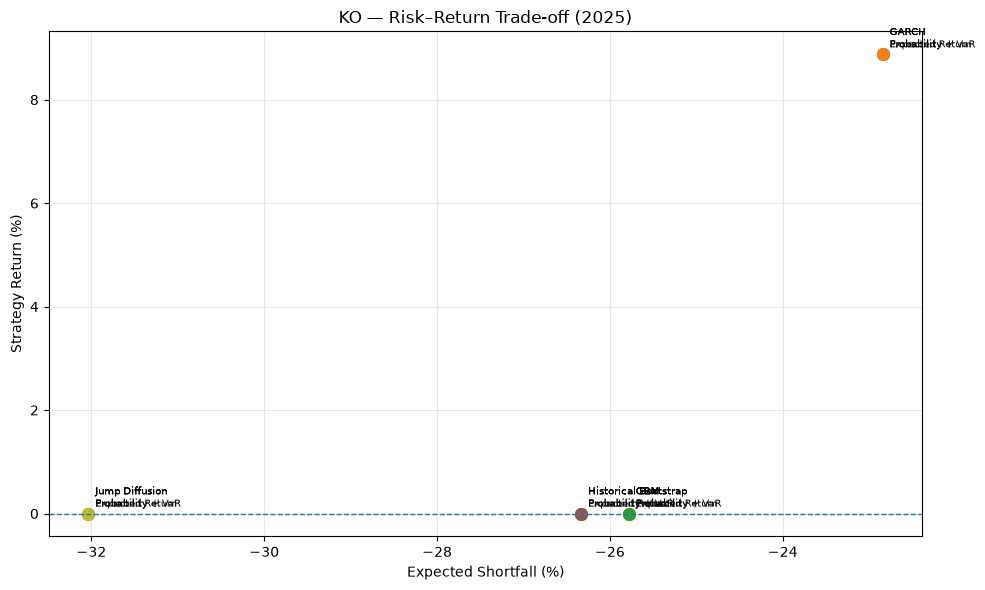

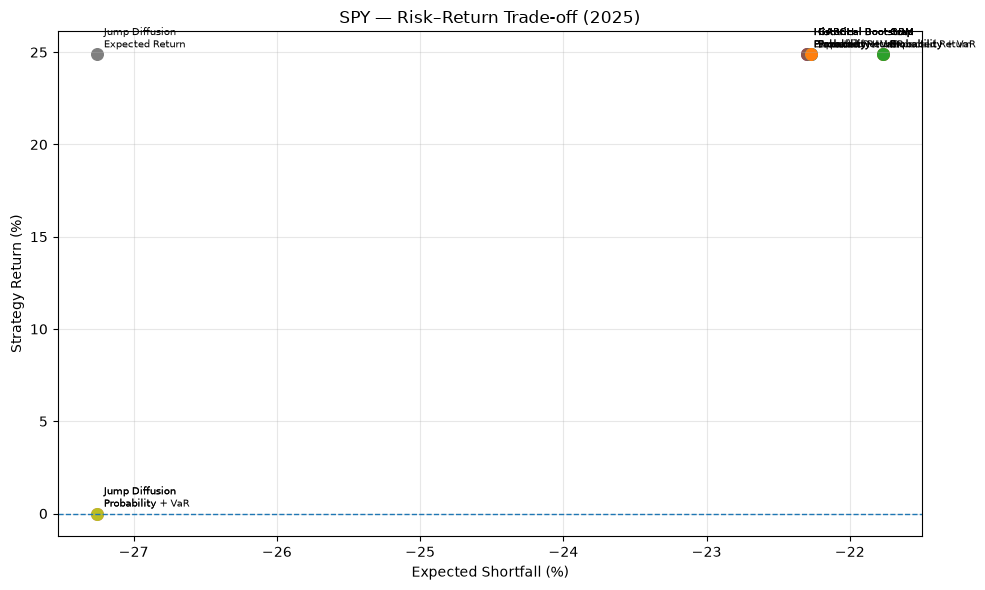

In [15]:
# Risk–return comparison for each selected year

risk = yearly_results[
    ["Ticker", "Model", "Year", "ES (%)"]
].copy()

returns = strategy_results[
    ["Ticker", "Model", "Strategy", "Year", "Strategy Return (%)"]
].copy()

risk_return = returns.merge(
    risk,
    on=["Ticker", "Model", "Year"],
    how="left"
)

for year in years:
    for ticker in stocks:

        current = risk_return[
            (risk_return["Ticker"] == ticker) &
            (risk_return["Year"] == year)
        ].copy()

        plt.figure(figsize=(10, 6))

        for model in models:
            for strategy in strategies:
                point = current[
                    (current["Model"] == model) &
                    (current["Strategy"] == strategy)
                ]
                if point.empty:
                    continue
                x = point["ES (%)"].iloc[0]
                y = point["Strategy Return (%)"].iloc[0]
                plt.scatter(x, y, s=70, label=f"{model} — {strategy}")
                plt.annotate(
                    f"{model}\n{strategy}",
                    (x, y),
                    xytext=(5, 5),
                    textcoords="offset points",
                    fontsize=7
                )

        plt.axhline(0, linestyle="--", linewidth=1)
        plt.xlabel("Expected Shortfall (%)")
        plt.ylabel("Strategy Return (%)")
        plt.title(f"{ticker} — Risk–Return Trade-off ({year})")
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()


## 13. Strategy results by year

This table is useful for checking exactly when each strategy bought, held, and what return it achieved.

In [16]:
strategy_results[
    [
        "Ticker",
        "Model",
        "Strategy",
        "Year",
        "Probability Up",
        "Decision",
        "Predicted",
        "Actual",
        "Actual Return (%)",
        "Strategy Return (%)"
    ]
].sort_values(
    ["Ticker", "Model", "Strategy", "Year"]
)


,Ticker,Model,Strategy,Year,Probability Up,Decision,Predicted,Actual,Actual Return (%),Strategy Return (%)
0,AAPL,GARCH,Expected Return,2016,0.8698,BUY,38.243087,23.668432,-3.013731,-3.013731
4,AAPL,GARCH,Expected Return,2020,0.8619,BUY,51.975750,70.659340,88.957792,88.957792
9,AAPL,GARCH,Expected Return,2025,0.8425,BUY,262.046487,248.615784,30.705241,30.705241
10,AAPL,GARCH,Probability,2016,0.8698,BUY,38.243087,23.668432,-3.013731,-3.013731
14,AAPL,GARCH,Probability,2020,0.8619,BUY,51.975750,70.659340,88.957792,88.957792
...,...,...,...,...,...,...,...,...,...,...
584,TSLA,Jump Diffusion,Probability,2020,0.8131,BUY,43.600374,27.888666,25.700119,25.700119
589,TSLA,Jump Diffusion,Probability,2025,0.7618,BUY,461.892848,403.839996,62.524148,62.524148
590,TSLA,Jump Diffusion,Probability + VaR,2016,0.8482,HOLD,36.023369,16.000668,7.913319,0.000000
594,TSLA,Jump Diffusion,Probability + VaR,2020,0.8131,HOLD,43.600374,27.888666,25.700119,0.000000


## 14. Overall strategy comparison

The final comparison uses only the selected evaluation years: 2016, 2020 and 2025.


In [17]:
final_comparison = (
    comparison[
        [
            "Ticker",
            "Model",
            "Strategy",
            "MAPE (%)",
            "Coverage (%)",
            "Directional Accuracy (%)",
            "Value at Risk (%)",
            "Expected Shortfall (%)",
            "Buy and Hold Return (%)",
            "Strategy Return (%)"
        ]
    ]
    .sort_values(["Ticker", "Strategy", "Model"])
)

print(final_comparison.to_string(index=False))


Ticker                Model          Strategy   MAPE (%)  Coverage (%)  Directional Accuracy (%)  Value at Risk (%)  Expected Shortfall (%)  Buy and Hold Return (%)  Strategy Return (%)
  AAPL                GARCH   Expected Return  29.724395          90.0                      70.0         -17.725178              -27.393034               918.754306           918.754306
  AAPL                  GBM   Expected Return  27.426760          90.0                      70.0         -21.533204              -30.296168               918.754306           918.754306
  AAPL Historical Bootstrap   Expected Return  27.220718          90.0                      70.0         -22.032216              -30.772880               918.754306           918.754306
  AAPL       Jump Diffusion   Expected Return  28.145465          90.0                      70.0         -24.057065              -33.390537               918.754306           918.754306
  AAPL                GARCH       Probability  29.724395          90.0

## Monte Carlo Simulation Visualisations

These plots show the distribution of simulated final prices and a sample of simulated price paths. They help demonstrate what the Monte Carlo models are actually producing, rather than only comparing summary metrics.

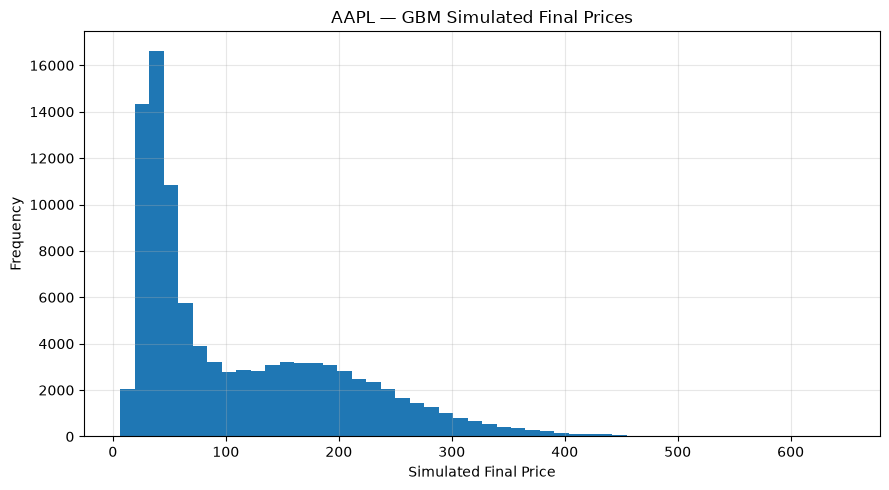

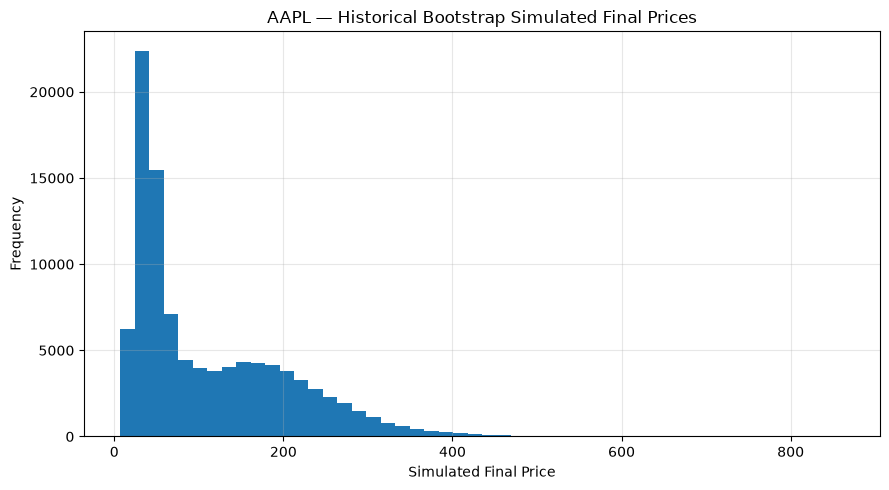

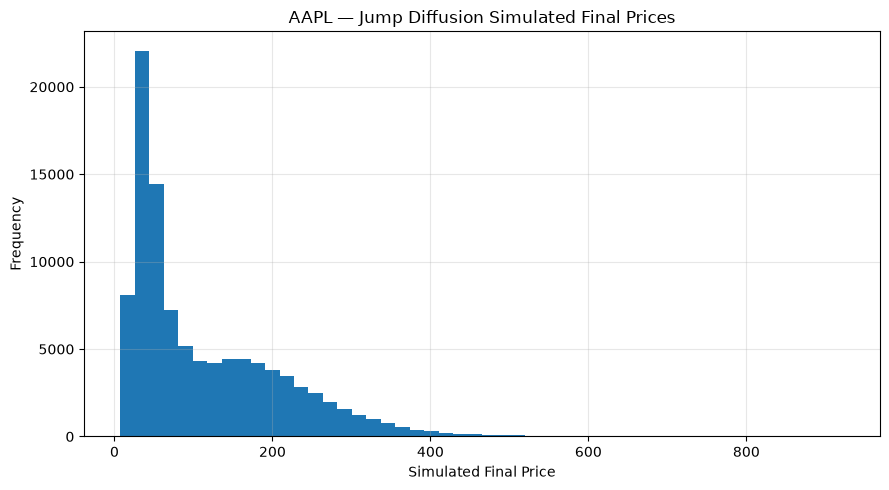

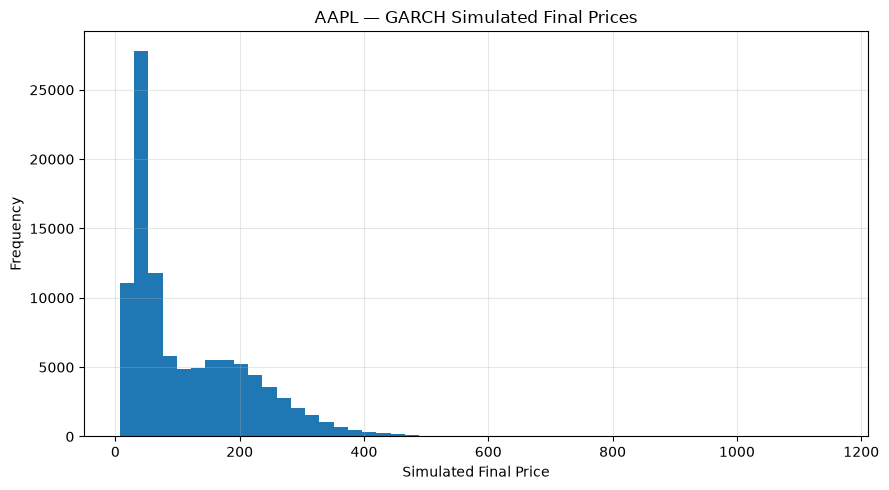

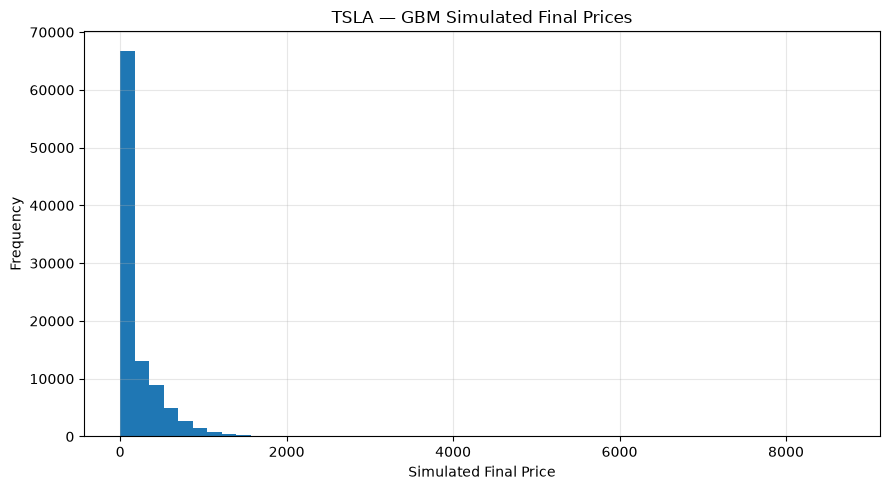

...

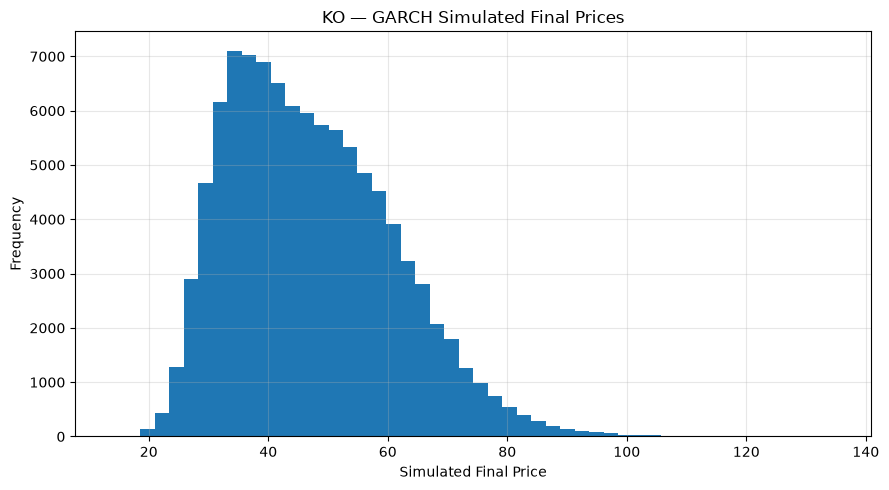

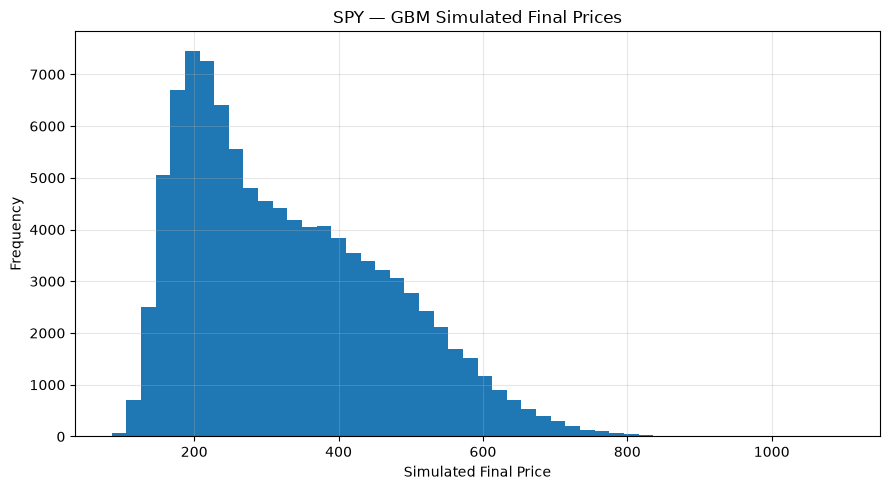

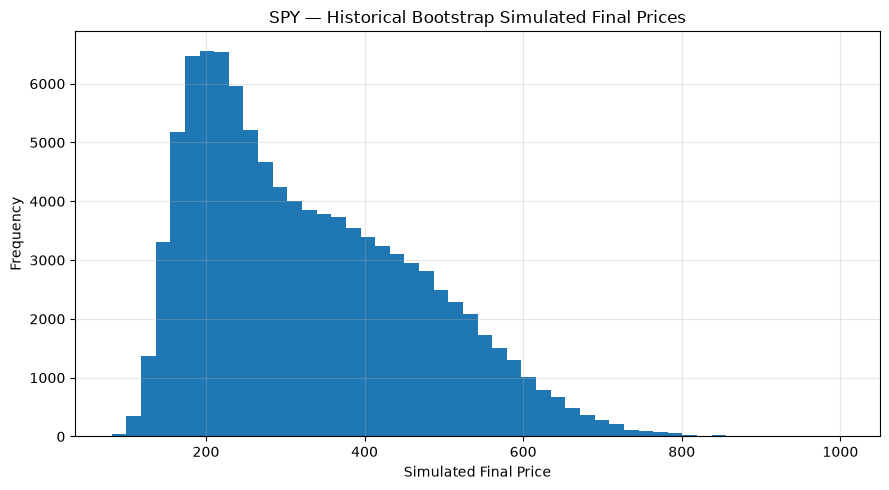

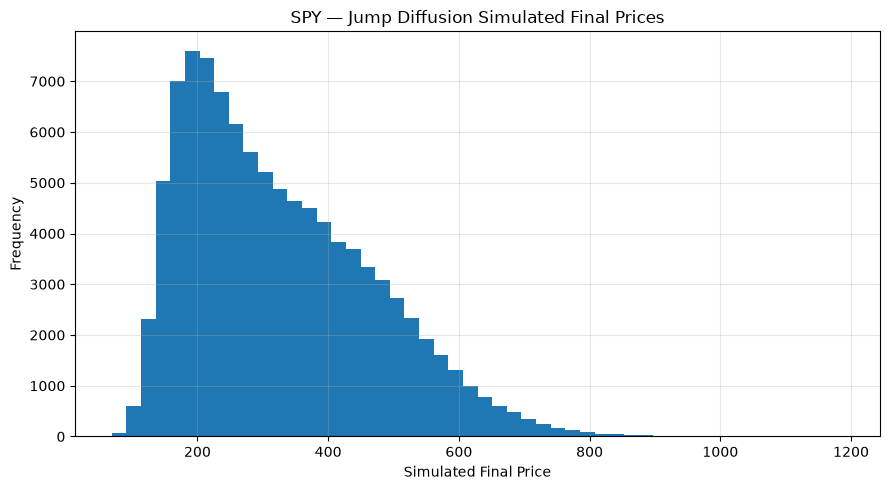

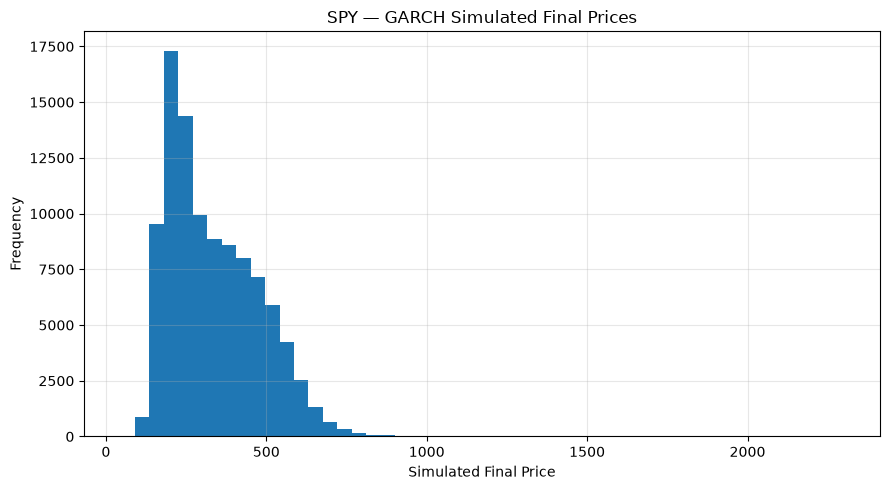

In [18]:
# Histogram of simulated final prices
# final_prices has no Year column in the supplied output, so it cannot be
# correctly split into 2016/2020/2025 without inventing a year mapping.

for ticker in stocks:
    for model in models:
        current = final_prices[
            (final_prices["Ticker"] == ticker) &
            (final_prices["Model"] == model)
        ]

        if current.empty:
            continue

        plt.figure(figsize=(9, 5))
        plt.hist(current["Final Price"], bins=50)
        plt.xlabel("Simulated Final Price")
        plt.ylabel("Frequency")
        plt.title(f"{ticker} — {model} Simulated Final Prices")
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()


### Sample Monte Carlo paths

This graph plots a small sample of the simulated paths produced by each model. The x-axis represents the simulation day and the y-axis represents the simulated stock price. Plotting all 10,000 runs would make the graph unreadable, so the analysis uses the 10 sample paths stored by `main.py`.

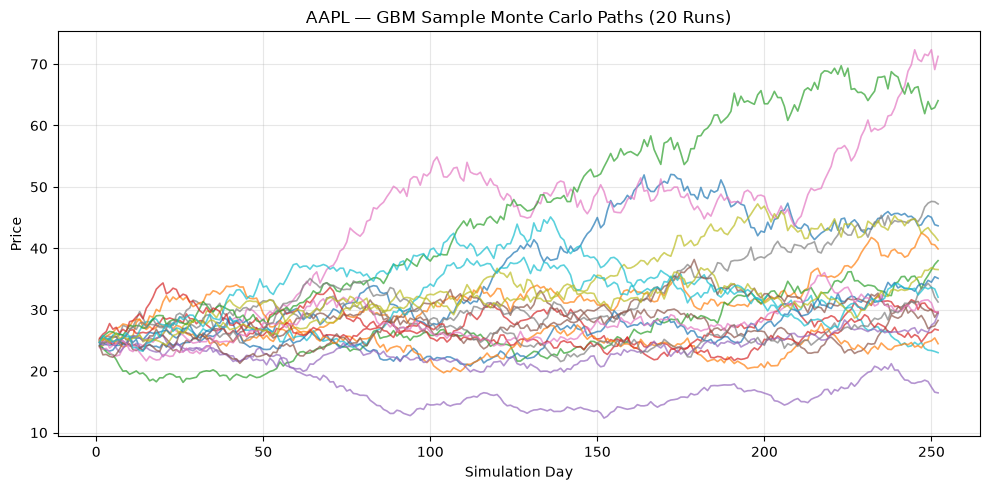

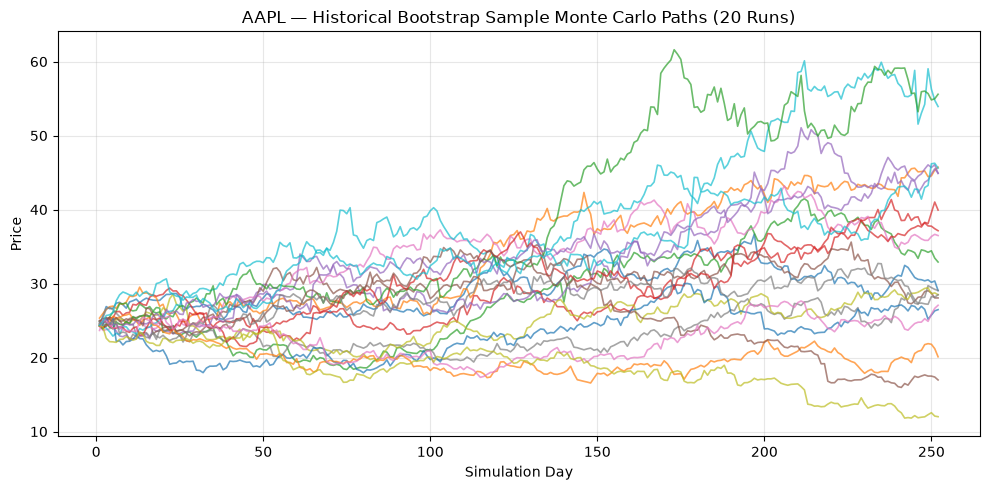

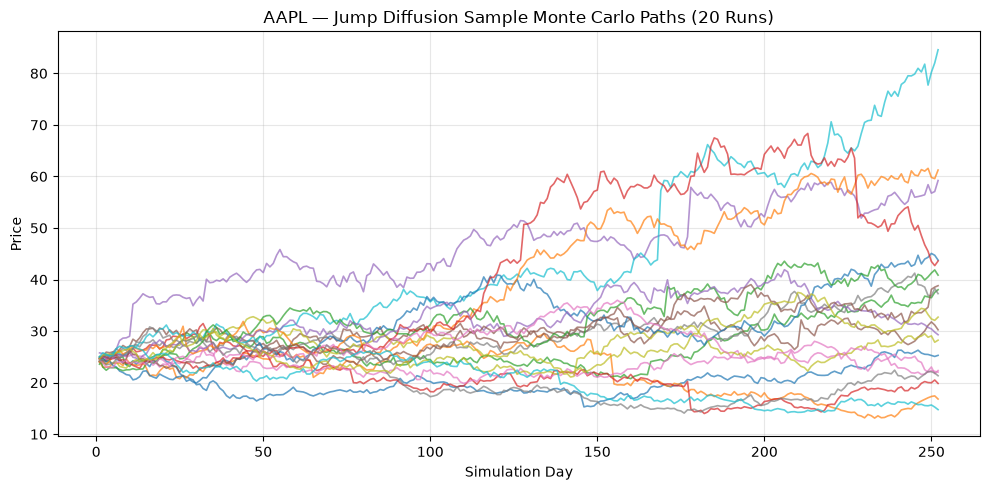

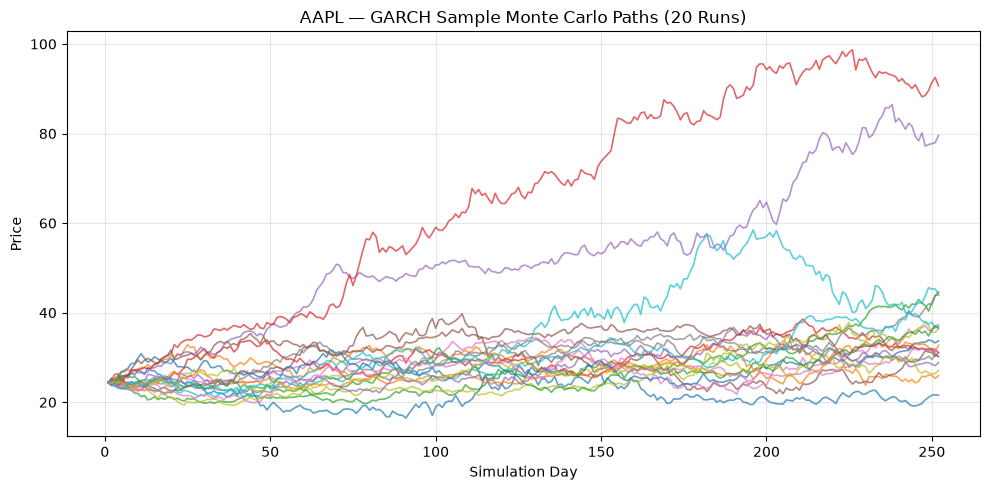

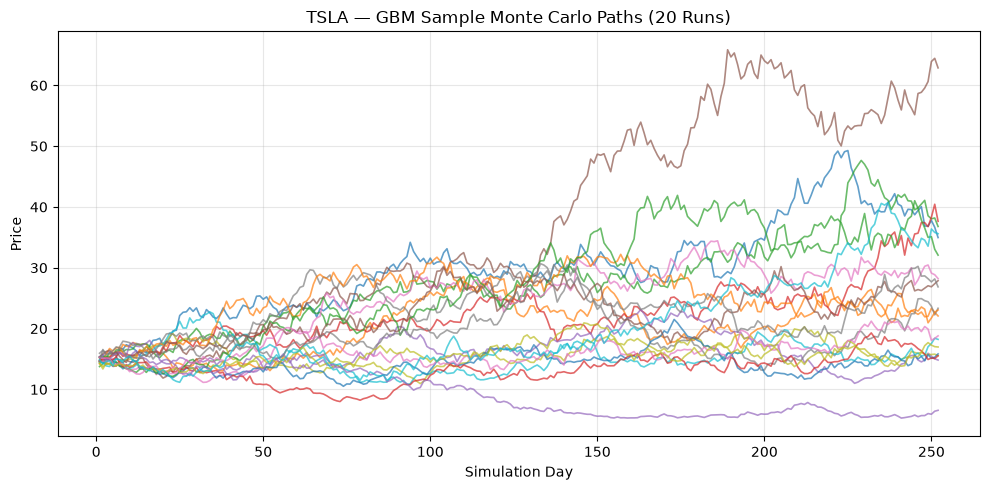

...

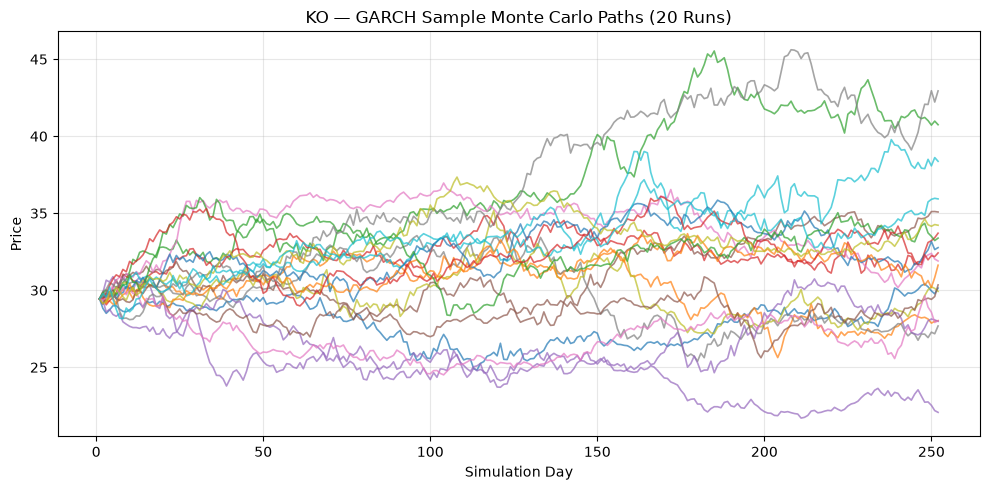

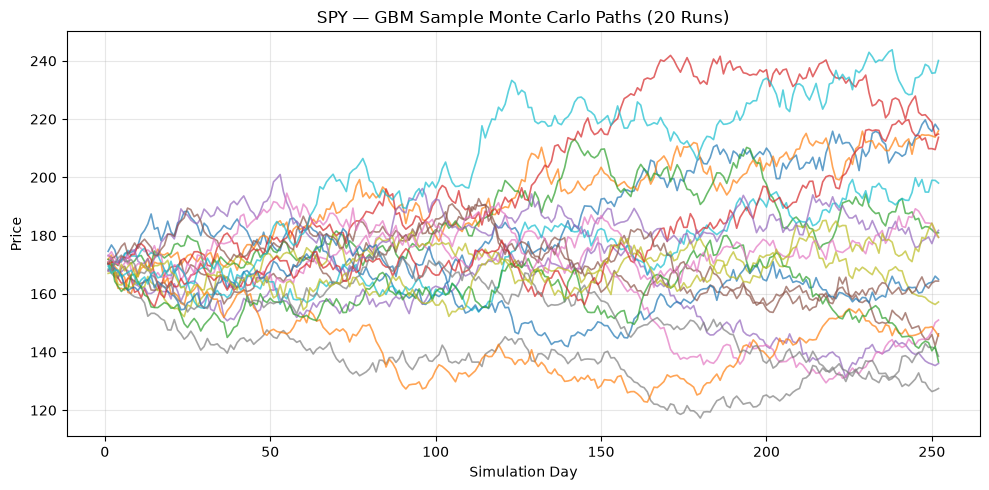

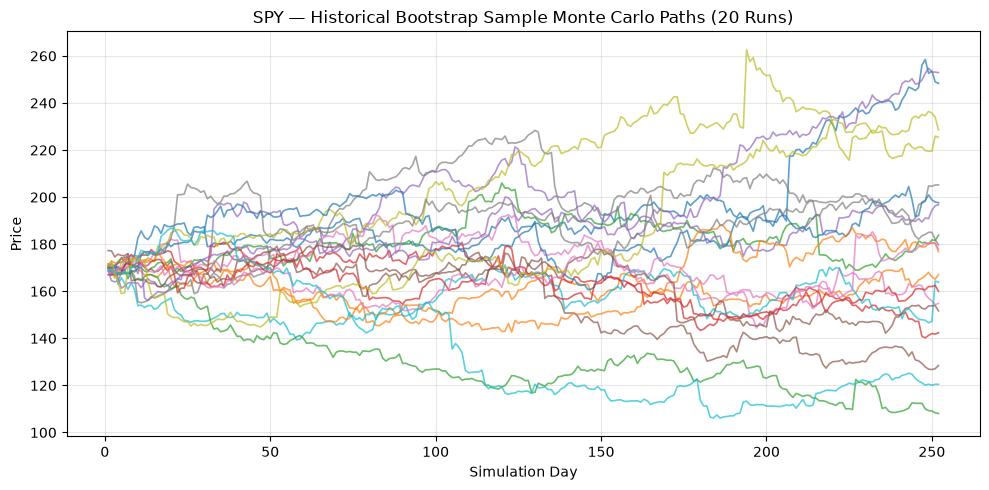

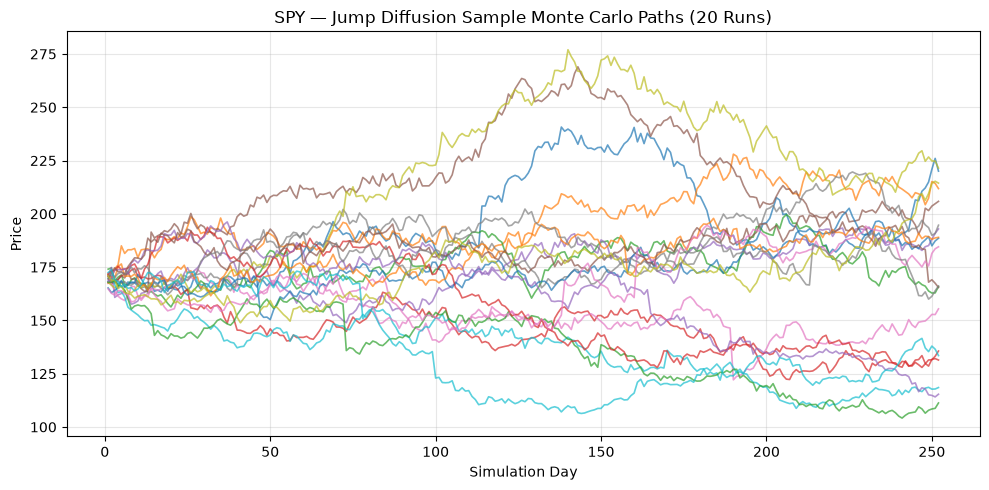

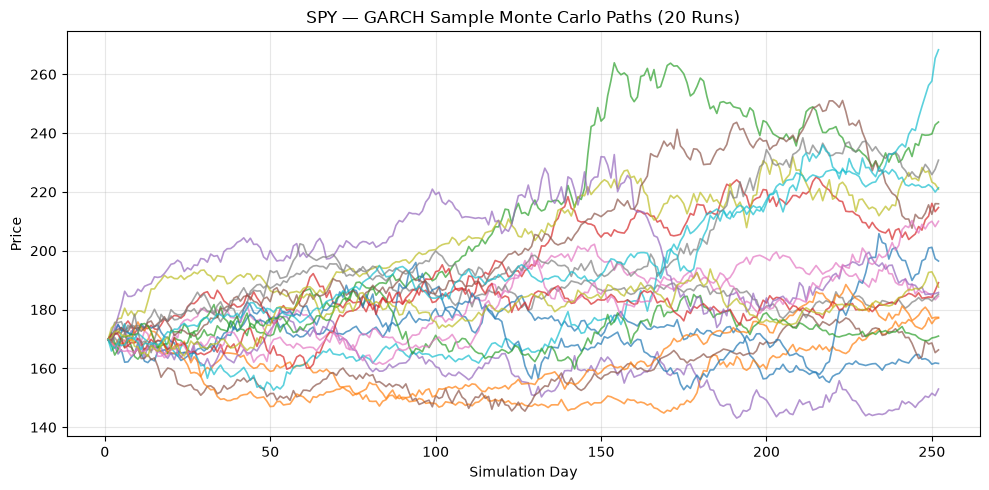

In [19]:
# Sample Monte Carlo paths
# sample_paths has no Year column in the supplied output, so these simulations
# cannot be correctly assigned to 2016/2020/2025 without changing main.py.

for ticker in stocks:
    for model in models:

        current = sample_paths[
            (sample_paths["Ticker"] == ticker) &
            (sample_paths["Model"] == model)
        ].copy()

        if current.empty:
            continue

        selected_runs = (
            current["Run"]
            .drop_duplicates()
            .sample(
                n=min(20, current["Run"].nunique()),
                random_state=42
            )
        )

        plt.figure(figsize=(10, 5))

        for run in selected_runs:
            path = current[current["Run"] == run].copy()
            path = (
                path.groupby("Day", as_index=False)["Price"]
                .first()
                .sort_values("Day")
            )
            plt.plot(path["Day"], path["Price"], linewidth=1.2, alpha=0.7)

        plt.xlabel("Simulation Day")
        plt.ylabel("Price")
        plt.title(f"{ticker} — {model} Sample Monte Carlo Paths (20 Runs)")
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()


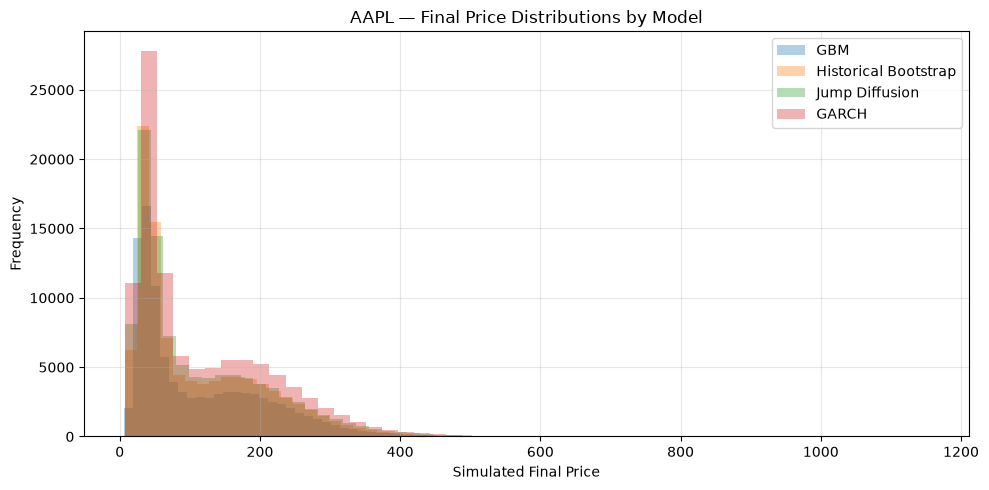

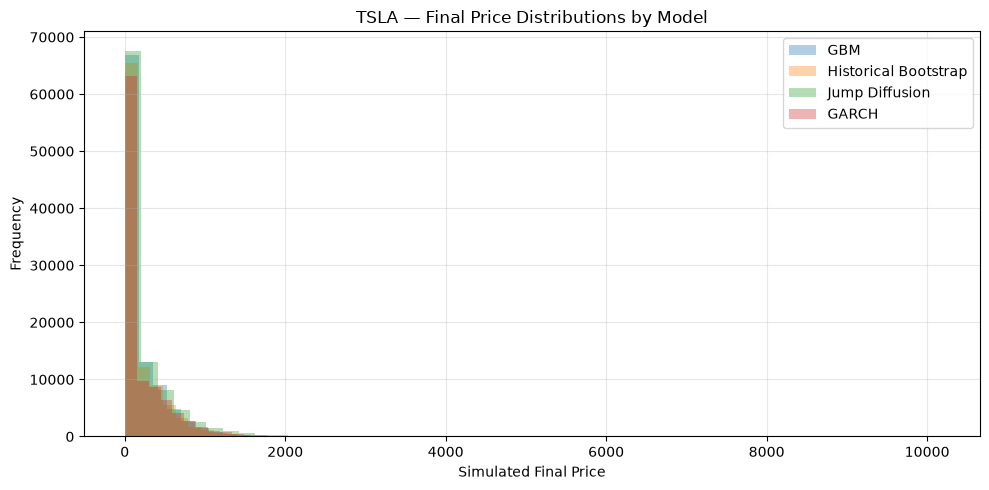

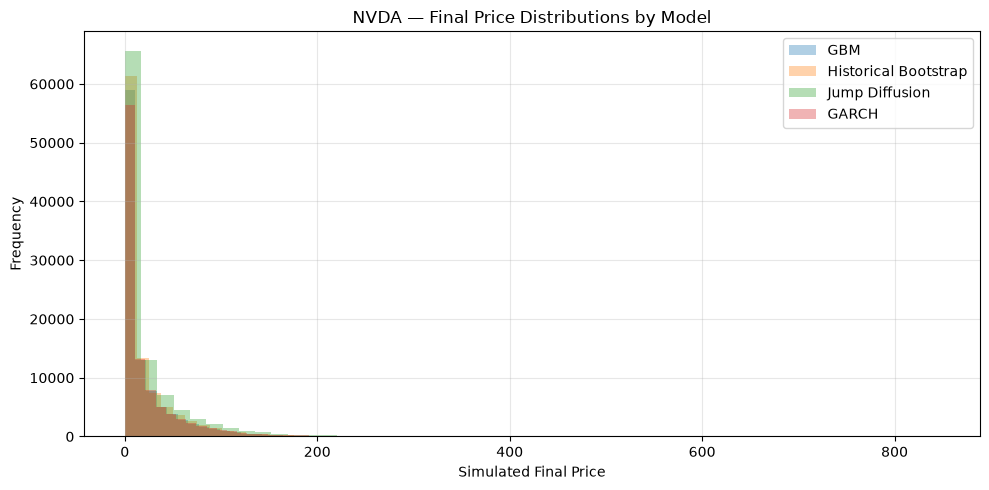

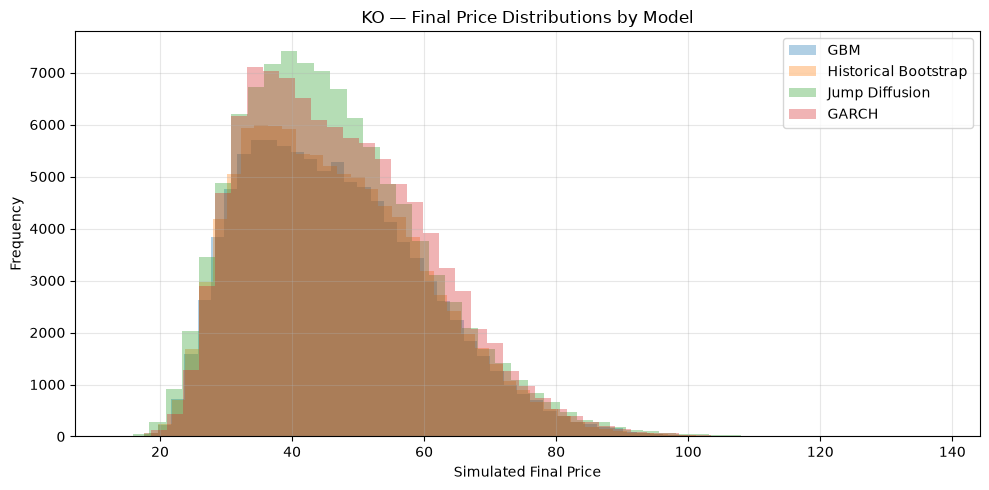

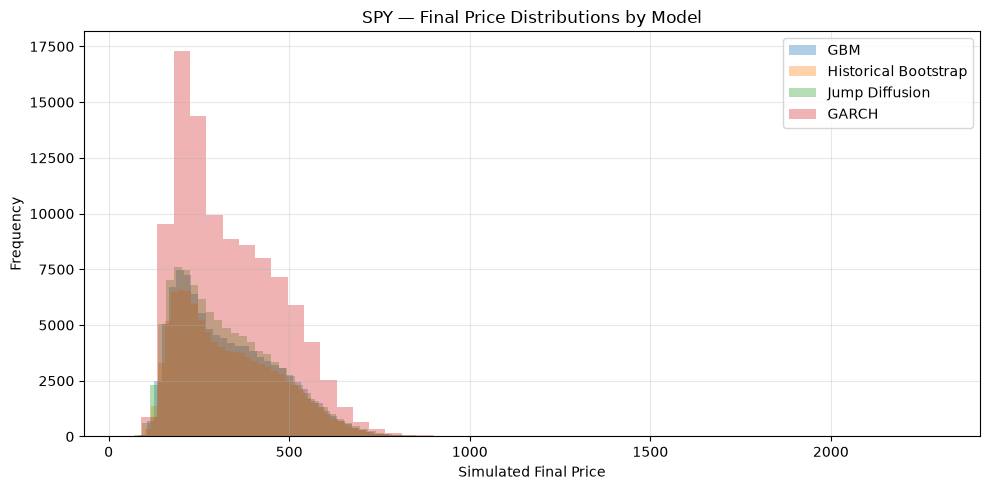

In [20]:
# Compare the distributions from all four models for each stock

for ticker in stocks:
    plt.figure(figsize=(10, 5))

    for model in models:
        current = final_prices[
            (final_prices["Ticker"] == ticker) &
            (final_prices["Model"] == model)
        ]

        if current.empty:
            continue

        plt.hist(
            current["Final Price"],
            bins=50,
            alpha=0.35,
            label=model
        )

    plt.xlabel("Simulated Final Price")
    plt.ylabel("Frequency")
    plt.title(f"{ticker} — Final Price Distributions by Model")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()